In [1]:
import numpy as np
import pandas as pd
import time
from ema_workbench.analysis import parcoords
from ema_workbench.analysis import clusterer, plotting, Density
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from ema_workbench import save_results, load_results
from ema_workbench.analysis import clusterer, plotting, Density
import os
import matplotlib.image as mpimg
import seaborn as sns
import matplotlib.pyplot as plt

from IPython.display import display, HTML
import dataframe_image as dfi
os.chdir(os.getcwd())
import sys

# insert at 1, 0 is the script path (or '' in REPL)
#pydice_folder = os.path.dirname(os.getcwd()) + "\\1_Model"
#sys.path.insert(1, pydice_folder)

from ema_workbench import (save_results)
from ema_workbench import (perform_experiments, Model, Policy, RealParameter, 
                           IntegerParameter, ScalarOutcome, ema_logging, MultiprocessingEvaluator)

ema_logging.log_to_stderr(ema_logging.INFO)

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\prim.py:30: ImportWarning: altair based interactive inspection not available
  warnings.warn(("altair based interactive "


<Logger EMA (DEBUG)>

In [2]:
results_total_short_term = pd.read_csv("experiments_short_term_uncertainty_total.csv")

results_total_short_term['Economic scenario'] = ""#df.loc[df['c1'] == 'Value', 'c2'] = 10
results_total_short_term.loc[results_total_short_term["scenario_pop_gdp"] == 0,'Economic scenario'] = "Nordhaus scenario"
results_total_short_term.loc[results_total_short_term["scenario_pop_gdp"] == 1,'Economic scenario'] = "SSP1"
results_total_short_term.loc[results_total_short_term["scenario_pop_gdp"] == 2,'Economic scenario'] = "SSP2"
results_total_short_term.loc[results_total_short_term["scenario_pop_gdp"] == 3,'Economic scenario'] = "SSP3"
results_total_short_term.loc[results_total_short_term["scenario_pop_gdp"] == 4,'Economic scenario'] = "SSP4"
results_total_short_term.loc[results_total_short_term["scenario_pop_gdp"] == 5,'Economic scenario'] = "SSP5"

policy_list = ["Egal_policy36","Prio_policy28","Util_policy370","Suff_policy30","nordhaus"]

results_total_short_term['policy_recoded']=results_total_short_term['principle'].astype(str).str[0:4] + "_"+ results_total_short_term['policy'] 

In [3]:
climate_action_tracker_time_series = pd.read_excel("Climate action tracker data.xlsx",sheet_name ="Timeseries")
climate_action_tracker_temperature = pd.read_excel("Climate action tracker data.xlsx",sheet_name ="Warming")


climate_action_tracker_time_series.columns

new = ['Year', 'AR5 BAU', 'AR5 BAU', 'Post-COVID-19',
       'Post-COVID-19', 'Pledges and Targets',
       'Pledges and Targets', 'Optimistic scenatio (net-zero targets)',
       '2°C consistent', '2°C consistent', '2°C consistent',
       '1.5°C consistent', '1.5°C consistent',
       '1.5°C consistent', 'Historical']

climate_action_tracker_time_series_new = climate_action_tracker_time_series

climate_action_tracker_time_series_new.columns = new
climate_action_tracker_time_series_new = climate_action_tracker_time_series_new.set_index(["Year"])
climate_action_tracker_time_series_new = climate_action_tracker_time_series_new.stack().to_frame().reset_index()
climate_action_tracker_time_series_new.columns = ["Year","Pathway","GtCO2 equivalent"]
climate_action_tracker_time_series_new = climate_action_tracker_time_series_new.set_index(['Year'])

In [4]:
climate_action_tracker_time_series_new

,Pathway,GtCO2 equivalent
Year,,
1990,Historical,35.989277
1991,Historical,36.352906
1992,Historical,35.529755
1993,Historical,35.736477
1994,Historical,35.857245
...,...,...
2100,2°C consistent,1.896429
2100,2°C consistent,-3.914504
2100,1.5°C consistent,-2.121944


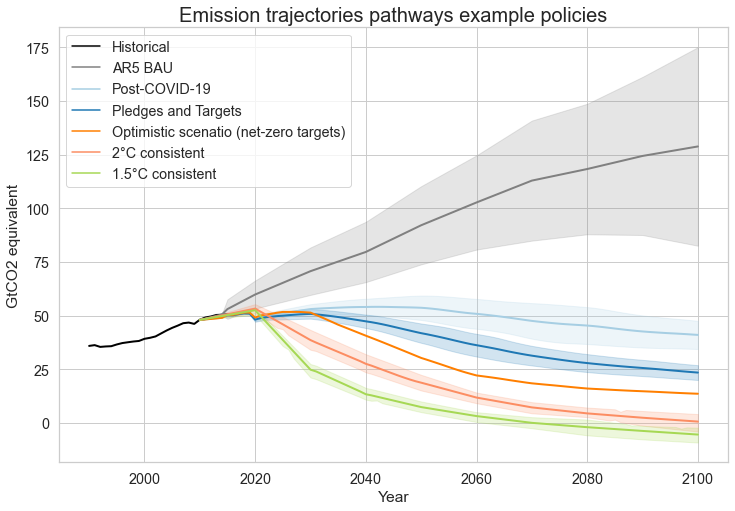

In [5]:
import seaborn as sns

sns.set(font_scale=1.30)  # crazy big
sns.set_style("whitegrid")
plt.figure(figsize=(12,8))
colors = {'Historical':"black", '2°C consistent':sns.color_palette("Set2")[1], 
          '1.5°C consistent':sns.color_palette("Set2")[4], 'AR5 BAU': "grey",
           'Post-COVID-19':sns.color_palette("Paired")[0] , 'Pledges and Targets': sns.color_palette("Paired")[1],
           'Optimistic scenatio (net-zero targets)':sns.color_palette("Paired")[7]}


sns.lineplot(data=climate_action_tracker_time_series_new,x = "Year" , y = "GtCO2 equivalent", 
             hue= "Pathway",palette = colors,dashes=True,lw=2)

plt.title("Emission trajectories pathways example policies", fontsize=20)

plt.legend()
plt.show()

## Final plot abatement trajectories

In [6]:
results_total_short_term[results_total_short_term["principle"]=="Egalitarian"]['policy_recoded'].unique()

array(['Egal_policy36', 'Egal_policy0', 'Egal_policy39', 'Egal_policy18',
       'Egal_policy14', 'Egal_policy42', 'Egal_policy48', 'Egal_policy29'],
      dtype=object)

In [7]:
climate_action_tracker_time_series_new = climate_action_tracker_time_series_new.reset_index()

objectives_list_timeseries_name = ["Industrial Emission "]
timepoints_to_save = [2005, 2015, 2025, 2035, 2045, 2055, 2065, 2075, 2085, 2095, 2105]

for objective in objectives_list_timeseries_name:
        outcomes =[]
        for year in timepoints_to_save:
            name_year = objective + str(year)
            outcomes.append(name_year)

output_df = climate_action_tracker_time_series_new
policies = ["Nord_nordhaus","Prio_policy19","Suff_policy30","Egal_policy14"]
Label = ["Nordhaus policy","Prioritarian policy","Sufficitarian policy","Egalitarian policy"]
policy_index=0

for i in policies:
    cluster_data = results_total_short_term[results_total_short_term['policy_recoded'] == i]
    cluster_data_35k = cluster_data[outcomes].stack().to_frame().reset_index()
    cluster_data_35k.columns = ["Index","Year","emissions"]
    cluster_data_35k["Year"] = cluster_data_35k["Year"].str[-4:]
    cluster_data_35k = cluster_data_35k.set_index(["Index"])
    
    #get additional variables with index ID to concat
    limmiu = cluster_data[['scenario_limmiu']].stack().to_frame().reset_index()
    eco_scenario = cluster_data[['scenario_pop_gdp']].stack().to_frame().reset_index() 
    
    limmiu.columns = ["Index","casted","Negative emissions"]
    eco_scenario.columns = ["Index","casted","Economic scenario"]
    limmiu = limmiu.set_index(["Index"])
    eco_scenario = eco_scenario.set_index(["Index"])
    
    additional_variables = pd.concat([limmiu,eco_scenario],axis=1)
    
    #combine additional data with emission data
    cluster_data_35k = pd.concat([additional_variables,cluster_data_35k],axis=1)
        
    scale_factor = climate_action_tracker_time_series_new.iloc[15,2] / cluster_data_35k.iloc[0,5]
    SSP_compare_scaled = cluster_data_35k
    SSP_compare_scaled["GtCO2 equivalent"] = SSP_compare_scaled["emissions"]*scale_factor
    SSP_compare_scaled = SSP_compare_scaled[["Year","GtCO2 equivalent","Negative emissions","Economic scenario"]]
    SSP_compare_scaled["Pathway"] = Label[policy_index]
    output_df = pd.concat([output_df,SSP_compare_scaled],axis = 0)
    policy_index = policy_index + 1
    
output_df['Year'] = output_df['Year'].astype(float)
output_df = output_df[output_df["Pathway"] != "Post-COVID-19"]
output_df = output_df[output_df["Pathway"] != "Optimistic scenatio (net-zero targets)"]

<ipython-input-7-8f38440b505d>:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SSP_compare_scaled["Pathway"] = Label[policy_index]


In [11]:
sns.color_palette()

[(0.2980392156862745, 0.4470588235294118, 0.6901960784313725),
 (0.8666666666666667, 0.5176470588235295, 0.3215686274509804),
 (0.3333333333333333, 0.6588235294117647, 0.40784313725490196),
 (0.7686274509803922, 0.3058823529411765, 0.3215686274509804),
 (0.5058823529411764, 0.4470588235294118, 0.7019607843137254),
 (0.5764705882352941, 0.47058823529411764, 0.3764705882352941),
 (0.8549019607843137, 0.5450980392156862, 0.7647058823529411),
 (0.5490196078431373, 0.5490196078431373, 0.5490196078431373),
 (0.8, 0.7254901960784313, 0.4549019607843137),
 (0.39215686274509803, 0.7098039215686275, 0.803921568627451)]

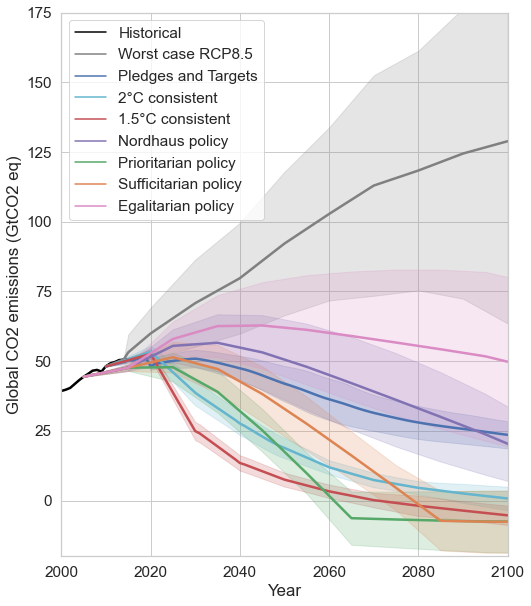

In [12]:
import seaborn as sns

sns.set(font_scale=1.4) #razy big
sns.set_style("whitegrid")
plt.figure(figsize=(8,10))


output_df.loc[output_df["Pathway"] == 'AR5 BAU','Pathway'] = "Worst case RCP8.5"

colors = {'Historical':"black", '2°C consistent':sns.color_palette()[9], 
          '1.5°C consistent':sns.color_palette()[3], 'Worst case RCP8.5': "grey",
           'Post-COVID-19':sns.color_palette("Paired")[0] , 'Pledges and Targets': sns.color_palette()[0],
           'Optimistic scenatio (net-zero targets)':sns.color_palette()[8],
           'Sufficitarian policy':sns.color_palette()[1],
           'Prioritarian policy':sns.color_palette()[2],
           'Nordhaus policy':sns.color_palette()[4],
           'Egalitarian policy':sns.color_palette()[6]}

k= sns.lineplot(data=output_df,x = "Year" , y = "GtCO2 equivalent", hue= "Pathway",palette = colors,lw=2.5,ci="sd")
k.set(ylabel='Global CO2 emissions (GtCO2 eq)')

#plt.title("2100 Warming projections compared with principles", fontsize=22)
k.set(xlim=(2000,2100),ylim=(-20,175))

plt.legend()
plt.show()

k.figure.savefig("2100_IPCC_projection_comparision_final.png",dpi = 200,bbox_inches ="tight")

<Figure size 360x720 with 0 Axes>

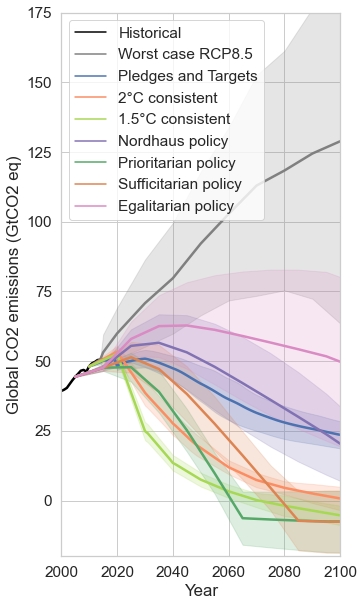

In [9]:
import seaborn as sns
from matplotlib import pyplot

sns.set(font_scale=1.4) #razy big
sns.set_style("whitegrid")
plt.figure(figsize=(5,10))


output_df.loc[output_df["Pathway"] == 'AR5 BAU','Pathway'] = "Worst case RCP8.5"

colors = {'Historical':"black", '2°C consistent':sns.color_palette("Set2")[1], 
          '1.5°C consistent':sns.color_palette("Set2")[4], 'Worst case RCP8.5': "grey",
           'Post-COVID-19':sns.color_palette("Paired")[0] , 'Pledges and Targets': sns.color_palette()[0],
           'Optimistic scenatio (net-zero targets)':sns.color_palette()[8],
           'Sufficitarian policy':sns.color_palette()[1],
           'Prioritarian policy':sns.color_palette()[2],
           'Nordhaus policy':sns.color_palette()[4],
           'Egalitarian policy':sns.color_palette()[6]}

a4_dims = (5, 10)
#df = mylib.load_data()
fig, ax = pyplot.subplots(figsize=a4_dims)

k= sns.lineplot(data=output_df,x = "Year" , y = "GtCO2 equivalent", hue= "Pathway",palette = colors,lw=2.5,ci="sd",ax=ax)
k.set(ylabel='Global CO2 emissions (GtCO2 eq)')

#plt.title("2100 Warming projections compared with principles", fontsize=22)
k.set(xlim=(2000,2100),ylim=(-20,175))

plt.legend()
plt.show()

k.figure.savefig("2100_IPCC_projection_comparision_final.png",dpi = 200,bbox_inches ="tight")

# Get data for plots

In [160]:
timepoints_to_save_dict = np.array([[2005, 2015, 2025, 2035, 2045, 2055, 2065, 2075, 2085, 2095, 2105],
                              [2005, 2015, 2025, 2035, 2045, 2055, 2065, 2075, 2085, 2095, 2105]])

###### OUTCOME DICT ##########
#objectives_list_timeseries_name =  ['Intratemporal utility GINI ','Intratemporal impact GINI ',
#                                    'Utility ','Damages ','Lowest income per capita ',
#                                    'Highest climate impact per capita ',
#                                   'Population under treshold ','Distance to treshold ' ]

objectives_list_timeseries_name =  ['Industrial Emission ',
                                    'Atmospheric Temperature ',
                                    'Lowest income per capita ', "Damages ",
                                    'Highest climate impact per capita ',
                                    'Population under treshold ','Total Output ',
                                    'Industrial Emission ','Intratemporal impact GINI ',
                                    'Intratemporal utility GINI ']

policy_list = ["Prio_policy19","Suff_policy30","Nord_nordhaus","Egal_policy42","Egal_policy14"]

timepoints_to_save = np.arange(2005,2105+10,10)                          

#objectives_list_timeseries_name =  ['Industrial Emission ','Total Output ','Atmospheric Temperature ']
#objectives_list_timeseries_name =  ['Total Output '] #'Atmospheric Temperature ']


outcome_dict = {}
for policy in policy_list:
    cluster_data = results_total_short_term[results_total_short_term['policy_recoded'] == policy]
    for objective in objectives_list_timeseries_name:
        outcomes =[]
        for year in timepoints_to_save:
            name_year = objective + str(year)
            outcomes.append(name_year)

        data = cluster_data[outcomes].to_numpy() 

        #randomly select 15000 timeseries for clustering
        rows = np.array(list(range(15000)))
        np.random.seed(0)
        selected_series = np.random.choice(rows, size=15000, replace=False)

        #get input data with select rows
        cluster_data_15k = data[selected_series]
        outcome_dict[objective+policy] = cluster_data_15k

outcome_dict['TIME'] = timepoints_to_save_dict

In [127]:
from model_outcomes_uncertainty_v2 import get_all_model_outcomes_uncertainty_search

## Get overview graph of sillouette scores for report

In [48]:
#Highest climate impact per capita _Suff_policy30_cluster_silhouette_width
dataDF = pd.read_csv('Utility _Suff_policy30_cluster_silhouette_width.txt', sep=" ", header=None)

In [49]:
import seaborn as sns
import matplotlib.pyplot as plt

scoresDF = pd.DataFrame()

policy_list = ["_Suff_policy30"]
objectives_list_timeseries_name =  ['Utility ','Damages ','Lowest income per capita ',
                                    'Highest climate impact per capita ']

for objective in objectives_list_timeseries_name:
    for policy in policy_list:
        dataDF = pd.read_csv(objective+ policy + '_cluster_silhouette_width.txt', sep=" ", header=None)
        dataDF.columns = [objective]
        scoresDF = scoresDF.append(dataDF.T,sort=True)
scoresDF = scoresDF.T
scoresDF.index.name = 'Number of clusters'

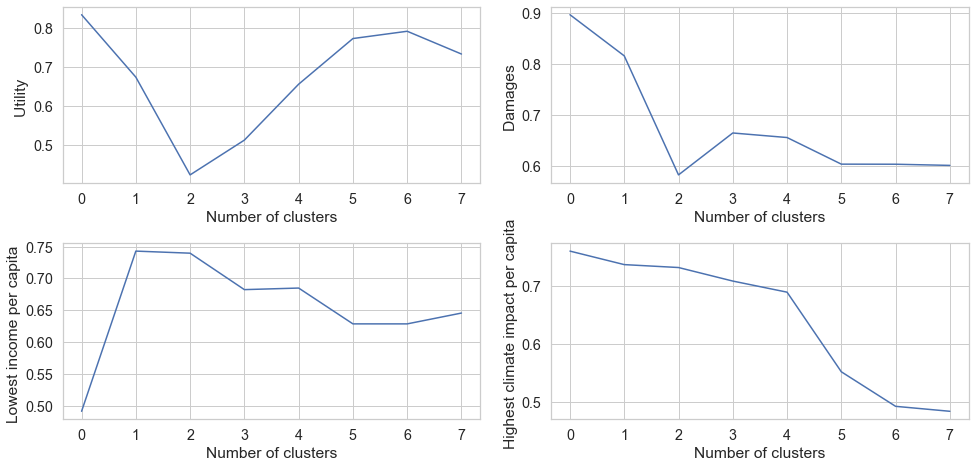

In [50]:
sns.set(font_scale=1.3)  # crazy big
sns.set_style("whitegrid")

import matplotlib.pyplot
fig, (ax1,ax2) = plt.subplots(2,2, figsize=(14,7))
fig.tight_layout(pad=2.0)
plot_index = [0,1,0,1,0,1,0,1]
plot_index_1 = [0,0,1,1,2,2,3,3]

sns.lineplot(data= scoresDF, x=scoresDF.index,y='Utility ',ax = ax1[0])
sns.lineplot(data= scoresDF, x=scoresDF.index,y='Damages ',ax = ax1[1])
#sns.lineplot(data= scoresDF, x=scoresDF.index,y='Intratemporal utility GINI ',ax = ax2[0])
#sns.lineplot(data= scoresDF, x=scoresDF.index,y='Intratemporal impact GINI ',ax = ax2[1])
sns.lineplot(data= scoresDF, x=scoresDF.index,y='Lowest income per capita ',ax = ax2[0])
sns.lineplot(data= scoresDF, x=scoresDF.index,y='Highest climate impact per capita ',ax = ax2[1])
#sns.lineplot(data= scoresDF, x=scoresDF.index,y='Population under treshold ',ax = ax4[0])
#sns.lineplot(data= scoresDF, x=scoresDF.index,y='Distance to treshold ',ax = ax4[1])

plt.show()
fig.savefig('Silloute widths of time series clustering Sufficitarian policy 30', bbox_inches='tight',dpi=300)

In [ ]:
timepoints_to_save_dict = np.array([[2005, 2015, 2025, 2035, 2045, 2055, 2065, 2075, 2085, 2095, 2105],
                              [2005, 2015, 2025, 2035, 2045, 2055, 2065, 2075, 2085, 2095, 2105]])

# All plots

In [134]:
policy_list = ["Nord_nordhaus"]
timepoints_to_save_dict = np.array([[2005, 2015, 2025, 2035, 2045, 2055, 2065, 2075, 2085, 2095, 2105],
                              [2005, 2015, 2025, 2035, 2045, 2055, 2065, 2075, 2085, 2095, 2105]])

In [158]:
#get output dict for all policy + outcome combinations to plot
objectives_list_timeseries_name =  ['Intratemporal utility GINI ','Intratemporal impact GINI ',
                                    'Utility ','Damages ','Lowest income per capita ',
                                    'Highest climate impact per capita ',
                                   'Population under treshold ','Distance to treshold ' ]

objectives_list_timeseries_name =  ['Damages ','Lowest income per capita ',
                                    'Highest climate impact per capita ',
                                    'Population under treshold ','Total Output ',
                                    'Industrial Emission ','Atmospheric Temperature ']

#policy_list = ["Nord_nordhaus","Prio_policy28","Suff_policy30"]
timepoints_to_save = np.arange(2005,2105+10,10)                          

#objectives_list_timeseries_name =  ['Industrial Emission ','Total Output ','Atmospheric Temperature ']
#objectives_list_timeseries_name =  ['Total Output '] #'Atmospheric Temperature ']

policy_list = ["Nord_nordhaus","Egal_policy36","Prio_policy19","Util_policy370","Suff_policy30","Egal_policy42","Egal_policy14"]

outcome_dict = {}
for policy in policy_list:
    cluster_data = results_total_short_term[results_total_short_term['policy_recoded'] == policy]
    for objective in objectives_list_timeseries_name:
        outcomes =[]
        for year in timepoints_to_save:
            name_year = objective + str(year)
            outcomes.append(name_year)

        data = cluster_data[outcomes].to_numpy() 

        #randomly select 15000 timeseries for clustering
        rows = np.array(list(range(15000)))
        np.random.seed(0)
        selected_series = np.random.choice(rows, size=15000, replace=False)

        #get input data with select rows
        cluster_data_15k = data[selected_series]
        outcome_dict[objective+policy] = cluster_data_15k

outcome_dict['TIME'] = timepoints_to_save_dict

KeyboardInterrupt: 

In [147]:
objectives_list_timeseries_name =  ['Intratemporal utility GINI ','Intratemporal impact GINI ',
                                    'Utility ','Damages ','Lowest income per capita ',
                                    'Highest climate impact per capita ',
                                    'Population under treshold ','Distance to treshold ' ]

policy_list = ["Egal_policy36","Prio_policy19","Util_policy370","Suff_policy30"]
#policy_list = ["Nord_nordhaus"]
#change 35 to 15k to run nordhaus

### Show silhouette score of each objective over each policy

In [140]:
scoresDF

NameError: name 'scoresDF' is not defined

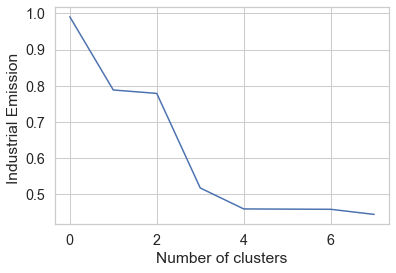

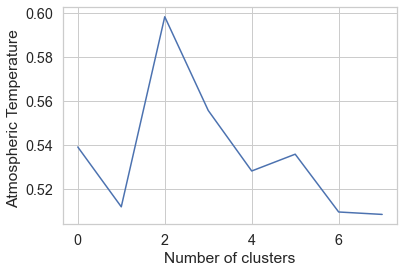

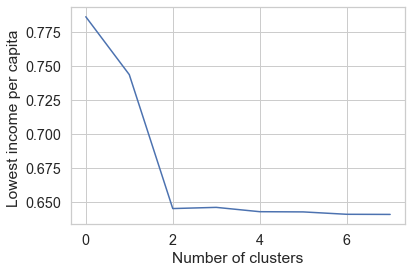

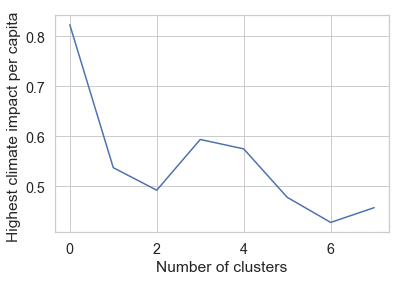

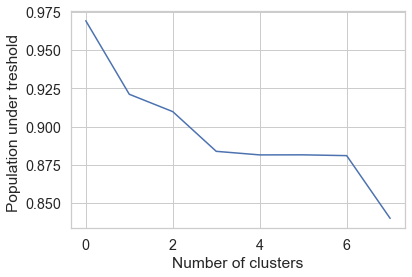

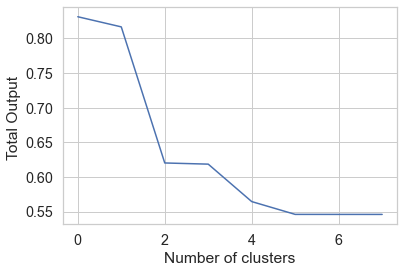

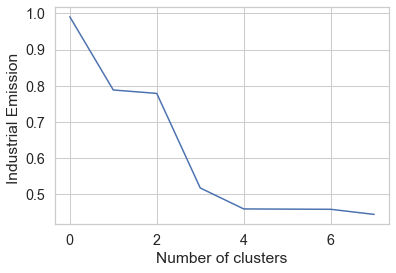

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt

scoresDF = pd.DataFrame()

policy_list = ["_Nord_nordhaus"]
objectives_list_timeseries_name =  ['Industrial Emission ','Atmospheric Temperature ',
                                    'Lowest income per capita ',
                                    'Highest climate impact per capita ',
                                    'Population under treshold ','Total Output ',
                                    'Industrial Emission ',]

for objective in objectives_list_timeseries_name:
    for policy in policy_list:
        dataDF = pd.read_csv(objective+ policy + '_cluster_silhouette_width.txt', sep=" ", header=None)
        dataDF.columns = [objective]
        scoresDF = pd.DataFrame()
        scoresDF = scoresDF.append(dataDF.T,sort=True).T
        scoresDF.index.name = 'Number of clusters'

        sns.set(font_scale=1.3)  # crazy big
        sns.set_style("whitegrid")
        sns.lineplot(data= scoresDF, x=scoresDF.index,y=objective)

        plt.show()


## Generate plots for clustered outputs

Atmospheric Temperature 
Prio_policy19


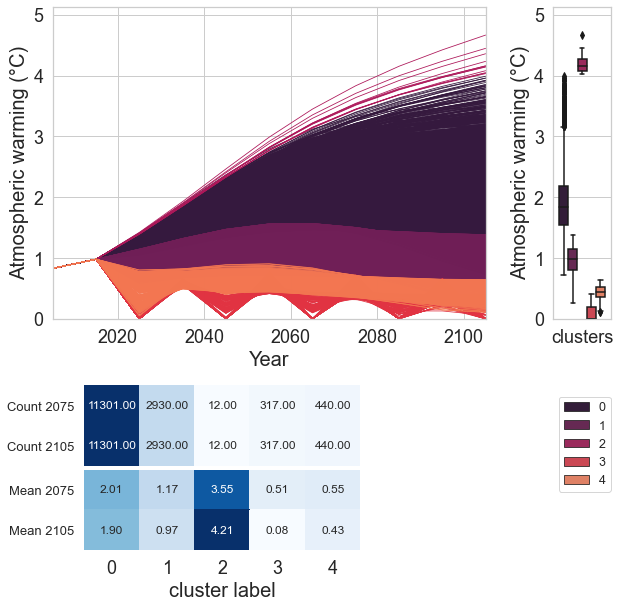

Lowest income per capita 
Prio_policy19


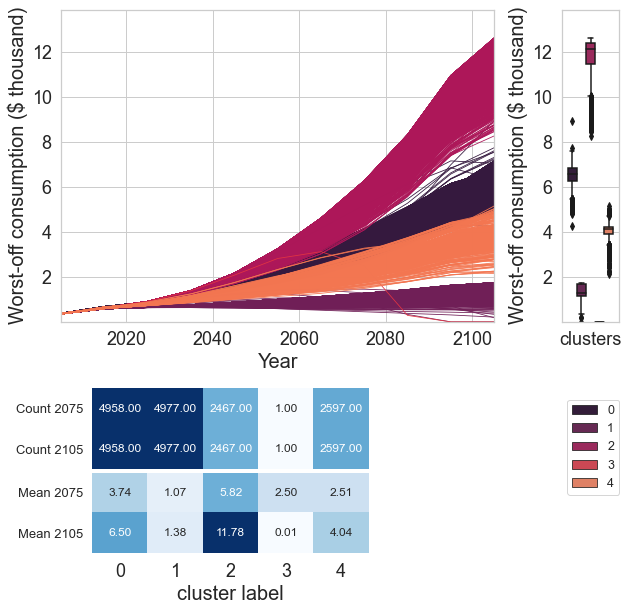

Damages 
Prio_policy19


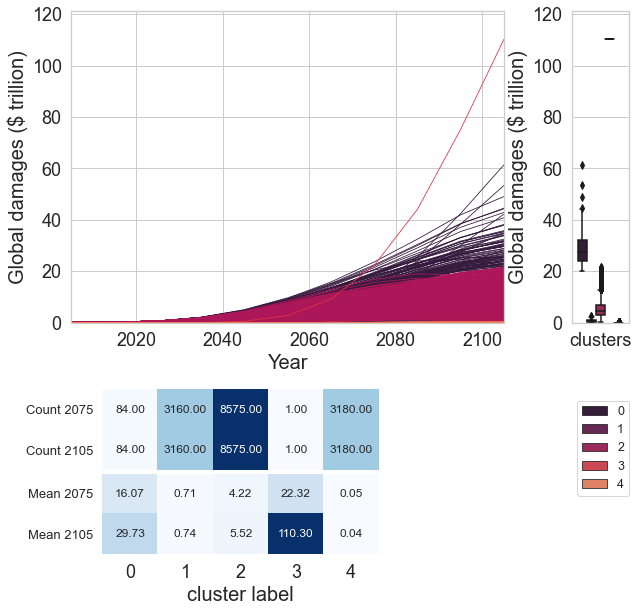

Highest climate impact per capita 
Prio_policy19


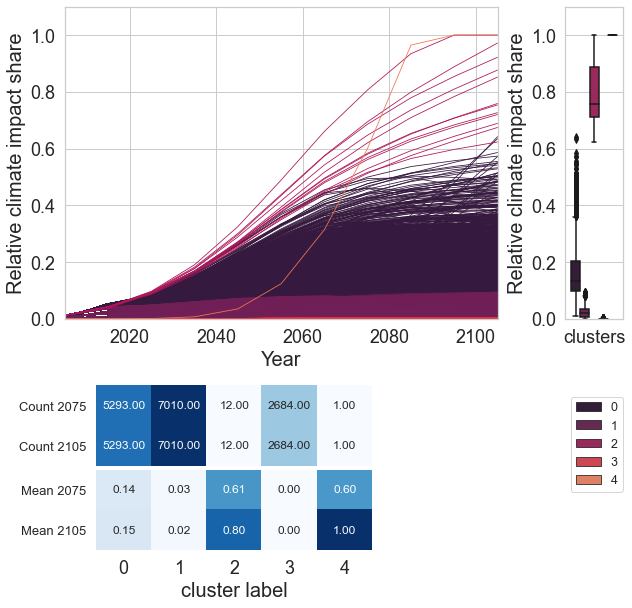

Population under treshold 
Prio_policy19


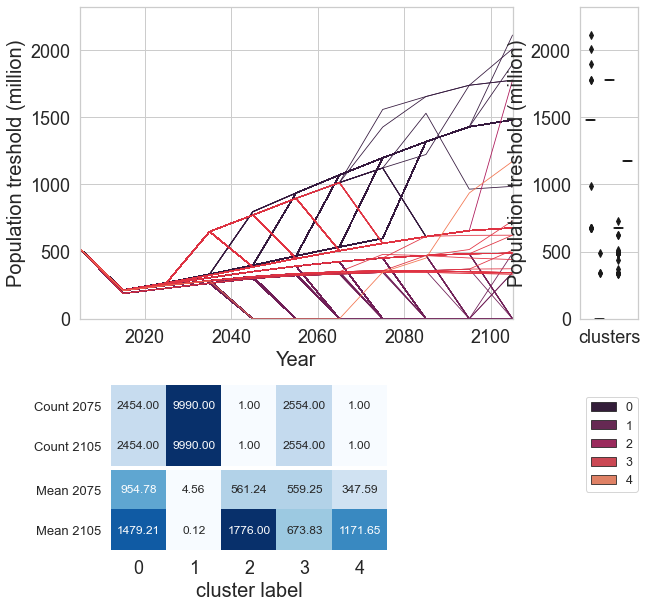

Total Output 
Prio_policy19


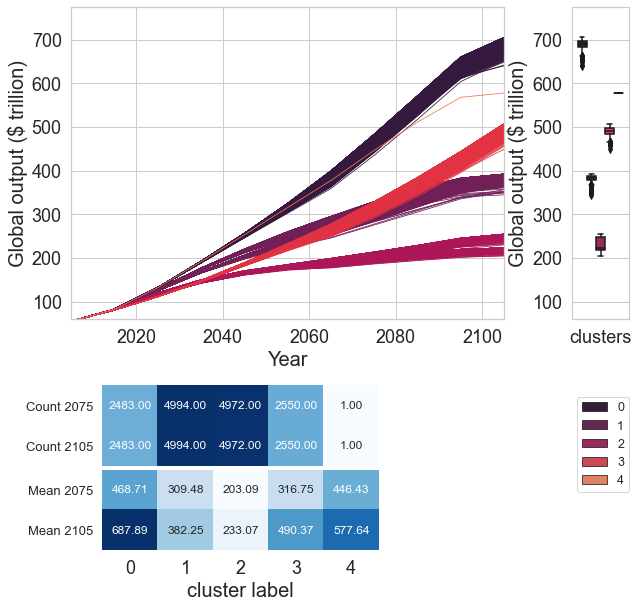

Industrial Emission 
Prio_policy19


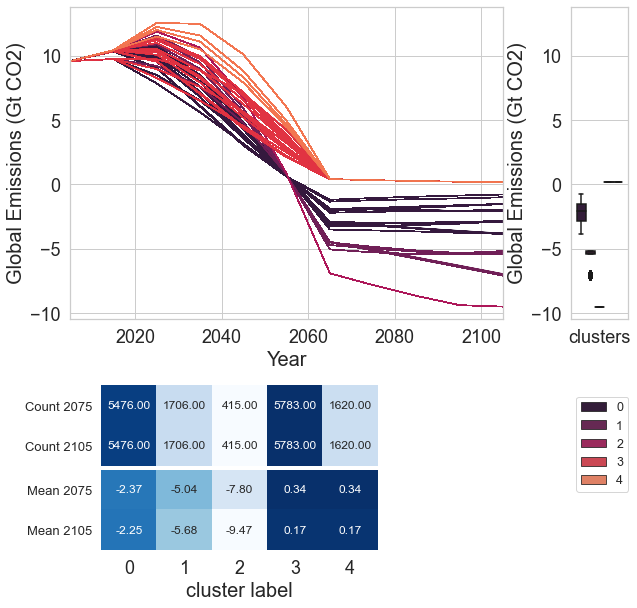

Atmospheric Temperature 
Suff_policy30


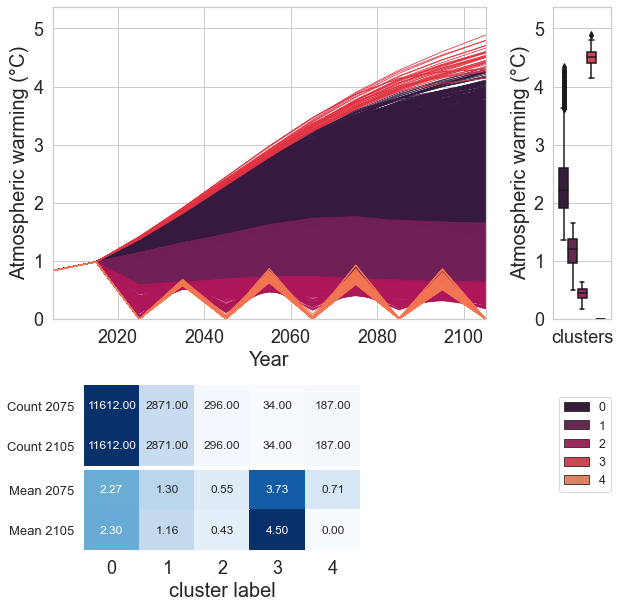

Lowest income per capita 
Suff_policy30


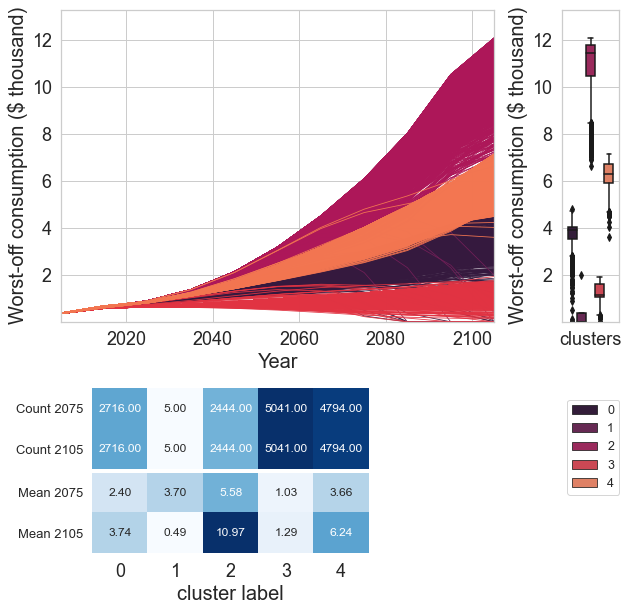

Damages 
Suff_policy30


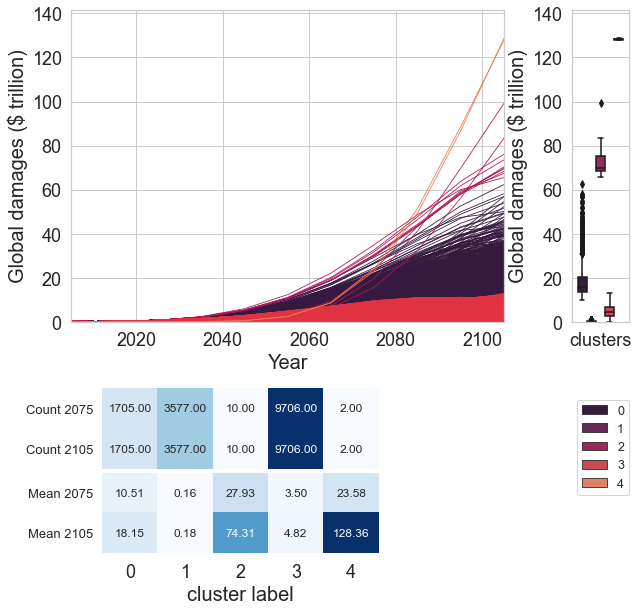

Highest climate impact per capita 
Suff_policy30


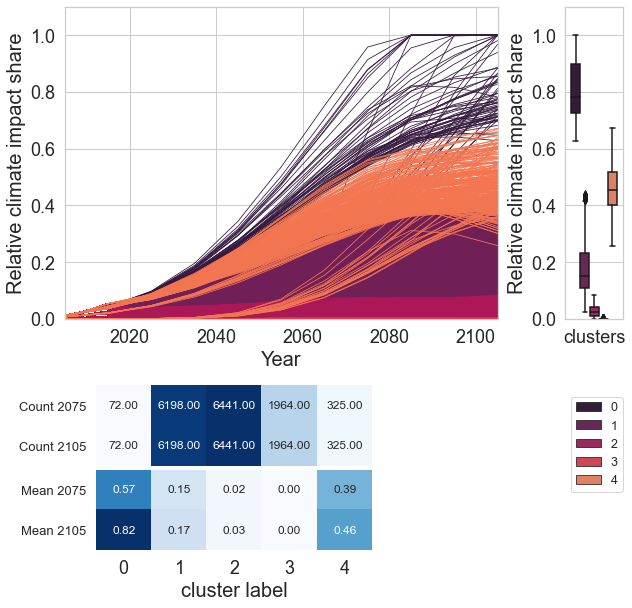

Population under treshold 
Suff_policy30


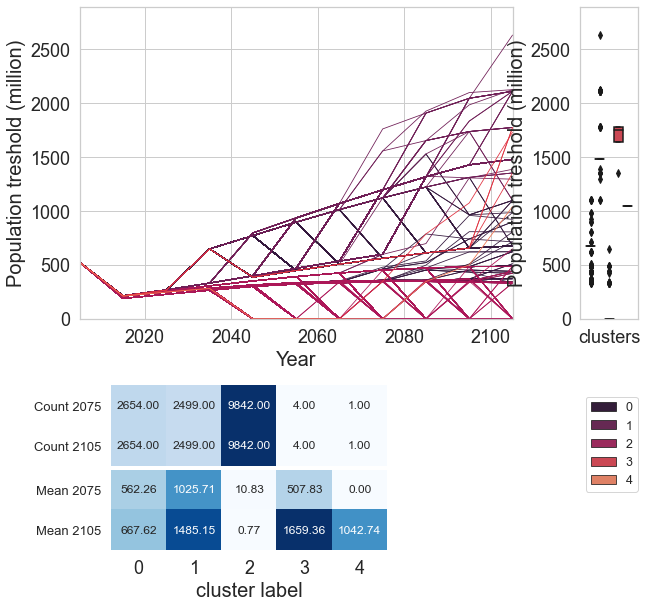

Total Output 
Suff_policy30


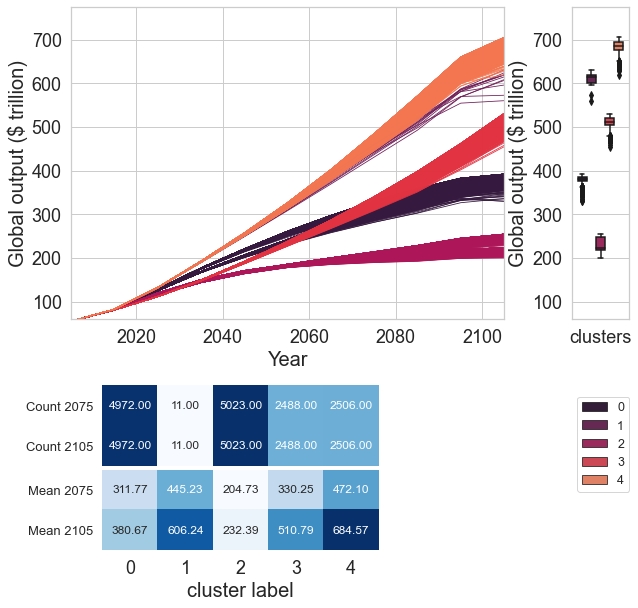

Industrial Emission 
Suff_policy30


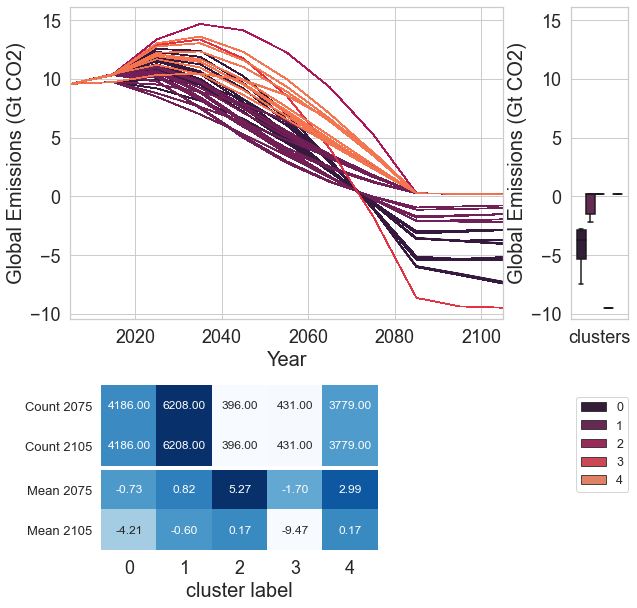

Atmospheric Temperature 
Nord_nordhaus


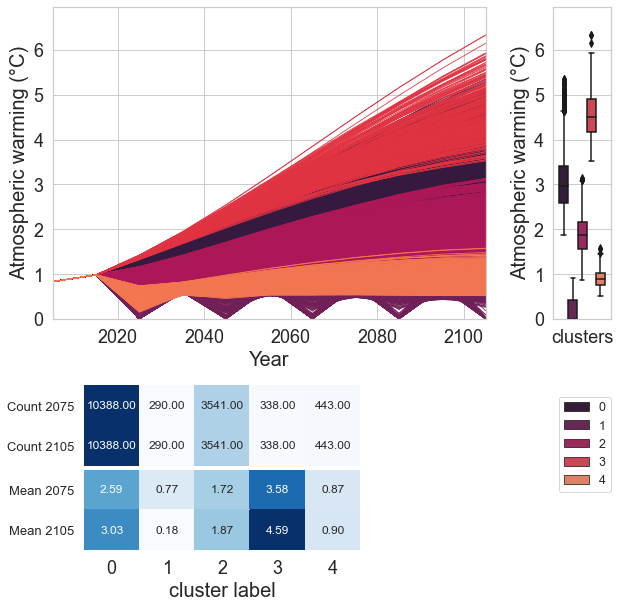

Lowest income per capita 
Nord_nordhaus


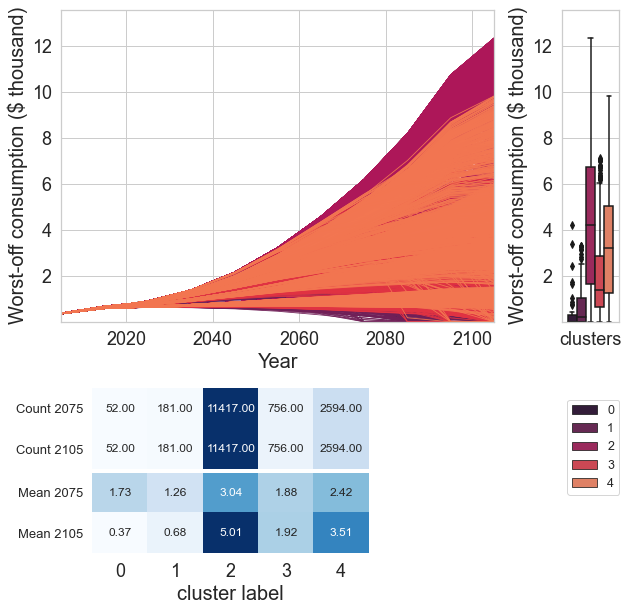

Damages 
Nord_nordhaus


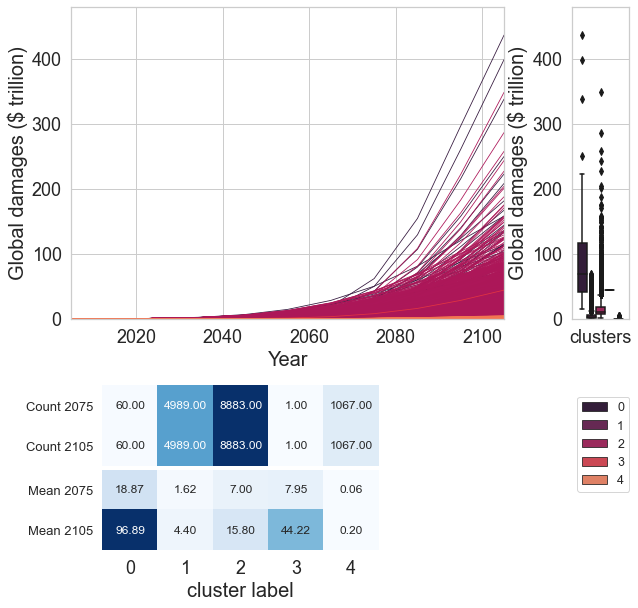

Highest climate impact per capita 
Nord_nordhaus


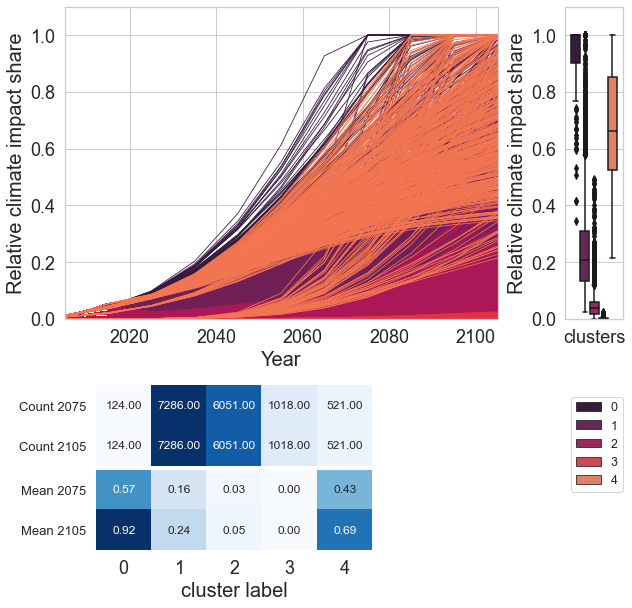

Population under treshold 
Nord_nordhaus


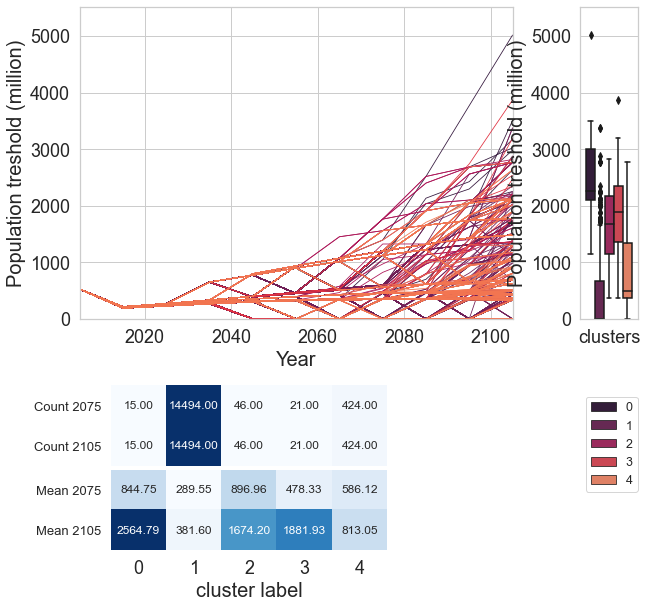

Total Output 
Nord_nordhaus


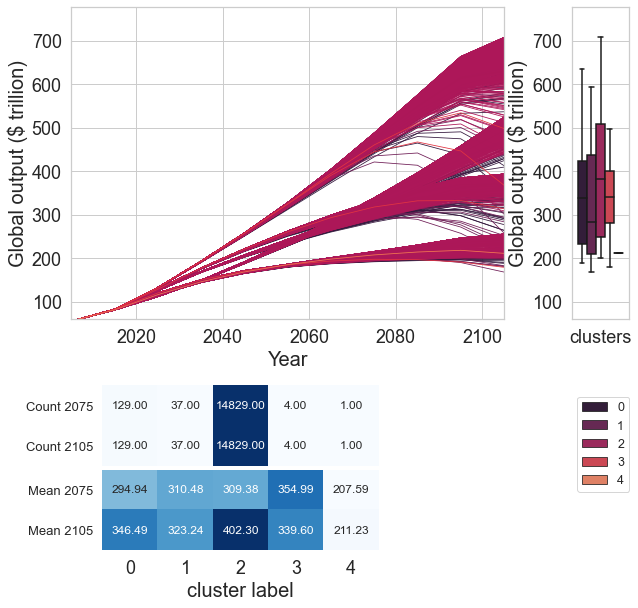

Industrial Emission 
Nord_nordhaus


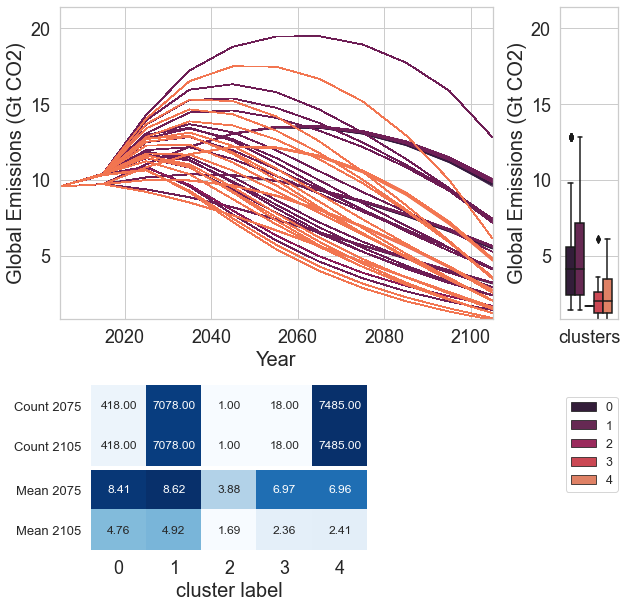

In [167]:
idx = pd.IndexSlice

#sns.set(font_scale=1.40, style='whitegrid')
timepoints_to_save = np.arange(2005,2105+10,10)

cluster_index = 0

objectives_list_timeseries_name =  ['Atmospheric Temperature ','Lowest income per capita ', "Damages ",
                                    'Highest climate impact per capita ','Population under treshold ',
                                    'Total Output ',"Industrial Emission "]#,#"Intratemporal impact GINI ",
                                    #'Intratemporal utility GINI ']

objectives_labels = ["Atmospheric warming (°C)","Worst-off consumption ($ thousand)","Global damages ($ trillion)",
                     "Relative climate impact share","Population treshold (million)","Global output ($ trillion)",
                     "Global Emissions (Gt CO2)","Regional impact inequality (GINI)","Regional consumption inequality (GINI)"]

policy_list = ["Prio_policy19","Suff_policy30","Nord_nordhaus"]

#determine for each policy the clusters based on the cluster objective
for policy in policy_list:
    #make graphs for each of those clusters (clusters are consistent within each graph)
    label_index = 0
    for objective in objectives_list_timeseries_name: 
        print(objective)
        print(policy)
        if policy == "Prio_policy19" and  objective == "Intratemporal impact GINI ":
            check_1 = True
            print("check1")
        else :
            check_1 = False
            
        if policy == "Prio_policy19" and objective == 'Intratemporal utility GINI ':
            check_2 = True
            print("check2")
        else:
            check_2 = False
        
        if check_1 == False and check_2 == False:
            df_to_plot = pd.read_csv("TSC_35k_" + objective + "_"+ policy + "_cluster_" + str(5) + ".csv")
            df_to_plot = df_to_plot.iloc[:,1:]
            df_to_plot = df_to_plot.set_index(['scenario'])
            df_to_plot = df_to_plot.drop(["model"],axis=1)

            #some variable need final step because variance in clustering is too big
            objective_name = objective + policy

            outcomes =[]
            for year in timepoints_to_save:
                name_year = objective + str(year)
                outcomes.append(name_year)

            #calculate descriptive statistics per cluster
            df = pd.DataFrame()
            df = pd.DataFrame(data = outcome_dict[objective_name],columns =outcomes,index = df_to_plot.index )

            #total output graph including cluster
            df_total = pd.concat([df,df_to_plot],axis=1)

            #df_total = df_total.set_index(["scenario"])

            #set up input data file for the seaborn lineplot
            input_data = df_total[outcomes]
            input_data = input_data.stack().to_frame().reset_index()
            input_data.columns = ["index","Year","Value"]
            input_data["Year"] = input_data["Year"].str[-4:]
            input_data = input_data.set_index(["index"])

            input_data['clusters'] = input_data.index.map(df_to_plot['clusters'])
            input_data["Year"] = input_data["Year"].astype(int)

            #set index of descriptive table and plot table to match clusters
            years = [2075,2105]
            get_list = []

            for year in years:
                outcome = objective + str(year)
                get_list.append(outcome)

            #get right labels
            #df_total['cluster_label'] = input_data[input_data["Year"]==2105].sort_values(
            #    by=["index"])["cluster_label"].str[0:1]

            #get statistics
            describe = df_total.groupby(['clusters'])[get_list].describe()
            incidence = df_total.groupby(['clusters'])[get_list].count()
            describe = describe.T

            #only select mean and count
            mean = describe.loc[idx[:, 'mean'], :]
            count = describe.loc[idx[:, 'count'], :]

            count = count.reset_index()
            count["index"] = count.iloc[:,1] +" " + count.iloc[:,0].str[-4:]
            count = count.iloc[:,2:]
            count = count.set_index(count.columns[-1])

            mean = mean.reset_index()
            mean["index"] = mean.iloc[:,1] +" " + mean.iloc[:,0].str[-4:]
            mean = mean.iloc[:,2:]
            mean = mean.set_index(mean.columns[-1])

            #get color palettes for clusters
            cluster_list = list(input_data["clusters"].unique())
            cluster_list.sort()

            colors = {}
            for i in range(0,len(cluster_list)):
                colors[cluster_list[i]] = sns.color_palette("rocket")[i]

            #build gridspec
            fig = plt.figure(constrained_layout=False,figsize=(10,10))
            gs = fig.add_gridspec(26,18)
            ax1 = fig.add_subplot(gs[0:15, 0:14])
            ax3 = fig.add_subplot(gs[0:15, 16:18])

            ax2 = fig.add_subplot(gs[18:22, 1:10])
            ax4 = fig.add_subplot(gs[22:26, 1:10])

            #draw individual plots on the right axis
            input_data.rename(columns={'Value':objective}, inplace=True)

            k = sns.lineplot(data=input_data, x="Year", y=objective, hue="clusters",legend= False,ci=None,
                             units = input_data.index,estimator=None,ax = ax1,palette=colors,linewidth = 0.8)
            k.set(ylabel = objectives_labels[label_index])

            input_data["id"] = "clusters"

            sns.boxplot(data = input_data[input_data["Year"]==2105],x="id",y= objective,hue = "clusters",
                        hue_order = cluster_list,ax= ax3,palette=colors)

            ax3.set(ylabel = objectives_labels[label_index])

            ax3.legend(bbox_to_anchor=(1, -0.25),borderaxespad=0,fontsize = 12.5)
            ax3.set_xlabel('')

            map1 = sns.heatmap(count,annot=True,fmt='.2f',cbar=False,cmap="Blues",
                        annot_kws={"fontsize":12},ax = ax2)
            map1.set_yticklabels(['Count 2075','Count 2105'], rotation=0,fontsize=13)
            map1.set_ylabel('')    
            map1.set_xlabel('')    

            map2 = sns.heatmap(mean,annot=True,fmt='.2f',cbar=False,cmap="Blues",
                        annot_kws={"fontsize":12},ax = ax4)
            map2.set_yticklabels(['Mean 2075','Mean 2105'], rotation=0,fontsize=13)
            map2.set_ylabel('')    
            map2.set_xlabel('cluster label')    

            ax1.set(ylim=((input_data[objective].min()+input_data[objective].min()*0.10), 
                          (input_data[objective].max()+input_data[objective].max()*0.10)))
            ax3.set(ylim=((input_data[objective].min()+input_data[objective].min()*0.10), 
                          (input_data[objective].max()+input_data[objective].max()*0.10)))
            ax1.set(xlim=(2005,2105))
            label_index = label_index + 1

            plt.show()
            fig.savefig("Agglomerative_clustering" + objective + policy + ".png" ,dpi = 200,bbox_inches ="tight")

## put cluster agglomerative graphs together

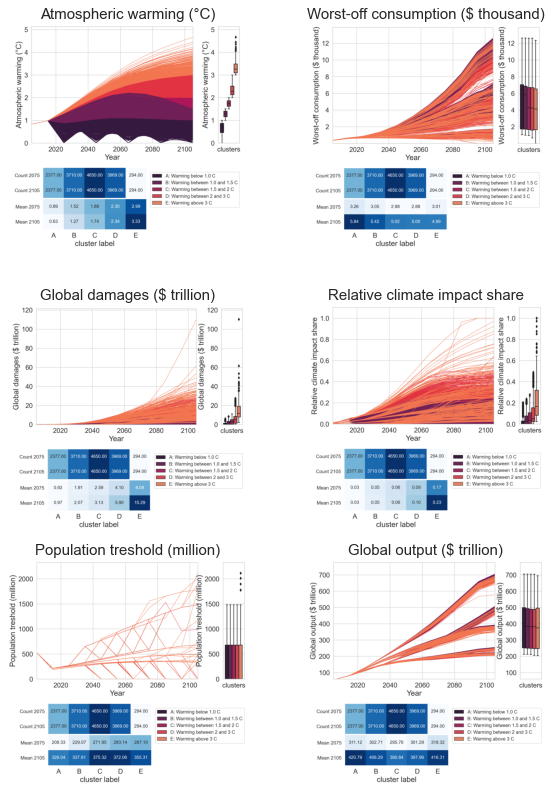

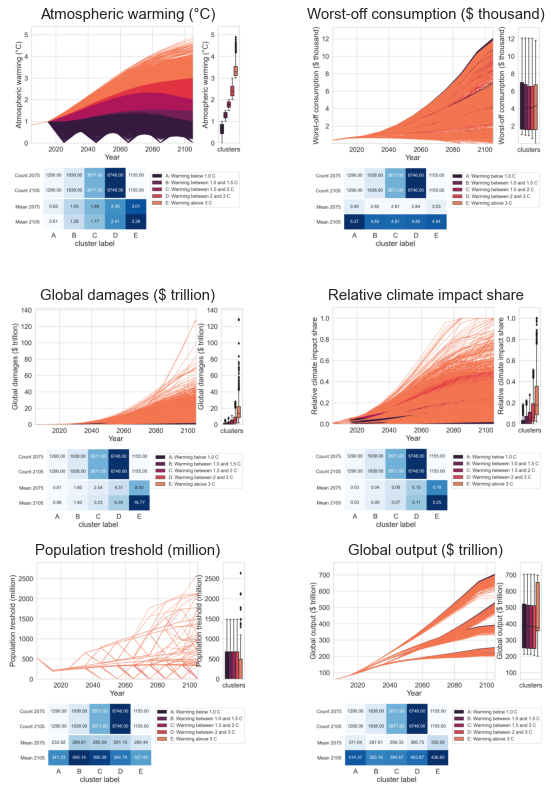

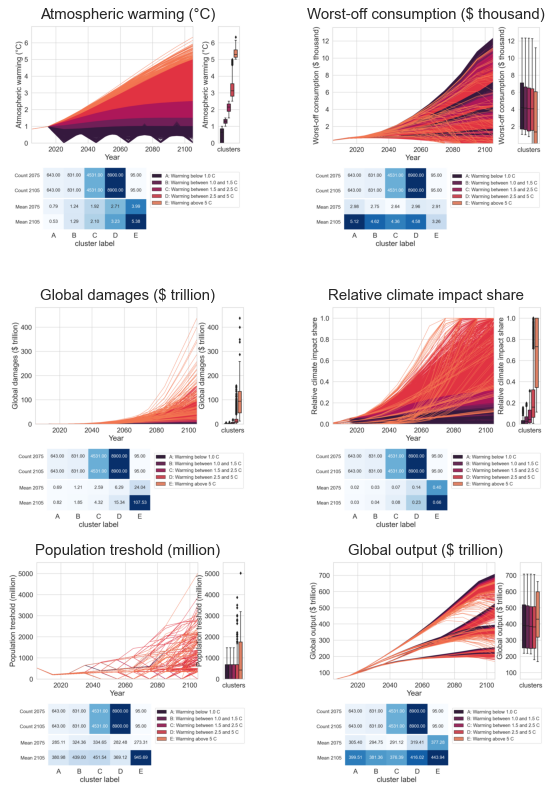

In [168]:
objectives =  ['Atmospheric Temperature ','Lowest income per capita ', "Damages ",
               'Highest climate impact per capita ','Population under treshold ',
               'Total Output ']

objectives_labels = ["Atmospheric warming (°C)","Worst-off consumption ($ thousand)","Global damages ($ trillion)",
                     "Relative climate impact share","Population treshold (million)","Global output ($ trillion)"]

policy_list = ["Prio_policy19","Suff_policy30","Nord_nordhaus"]

for policy in policy_list:
    fig = plt.figure(constrained_layout=False,figsize=(10,14))
    
    gs = fig.add_gridspec(30,60)
    ax1 = fig.add_subplot(gs[0:9, 0:28],frameon=False)
    ax2 = fig.add_subplot(gs[0:9, 32:60],frameon=False)
    ax3 = fig.add_subplot(gs[11:20, 0:28],frameon=False)
    ax4 = fig.add_subplot(gs[11:20, 32:60],frameon=False)
    ax5 = fig.add_subplot(gs[21:30, 0:28],frameon=False)
    ax6 = fig.add_subplot(gs[21:30, 32:60],frameon=False)

    axis = [ax1,ax2,ax3,ax4,ax5,ax6]

    axes_index = 0
    ax1.imshow(mpimg.imread("Clustering_plot" + objectives[0] + policy + ".png"))
    ax2.imshow(mpimg.imread("Clustering_plot" + objectives[1] + policy + ".png"))
    ax3.imshow(mpimg.imread("Clustering_plot" + objectives[2] + policy + ".png"))
    ax4.imshow(mpimg.imread("Clustering_plot" + objectives[3] + policy + ".png"))
    ax5.imshow(mpimg.imread("Clustering_plot" + objectives[4] + policy + ".png"))
    ax6.imshow(mpimg.imread("Clustering_plot" + objectives[5] + policy + ".png"))
    
    ax1.axes.get_yaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(False)
    ax3.axes.get_yaxis().set_visible(False)
    ax4.axes.get_yaxis().set_visible(False)
    ax5.axes.get_yaxis().set_visible(False)
    ax6.axes.get_yaxis().set_visible(False)
    ax1.axes.get_xaxis().set_visible(False)
    ax2.axes.get_xaxis().set_visible(False)
    ax3.axes.get_xaxis().set_visible(False)
    ax4.axes.get_xaxis().set_visible(False)
    ax5.axes.get_xaxis().set_visible(False)
    ax6.axes.get_xaxis().set_visible(False)

    ax1.set_title(objectives_labels[0],fontdict={'fontsize' : 15}, loc='center')
    ax2.set_title(objectives_labels[1],fontdict={'fontsize' : 15}, loc='center')
    ax3.set_title(objectives_labels[2],fontdict={'fontsize' : 15}, loc='center')
    ax4.set_title(objectives_labels[3],fontdict={'fontsize' : 15}, loc='center')
    ax5.set_title(objectives_labels[4],fontdict={'fontsize' : 15}, loc='center')
    ax6.set_title(objectives_labels[5],fontdict={'fontsize' : 15}, loc='center')
    
    plt.show()
    fig.savefig("Agglomerative_clustering_plot_overview_" + policy + ".png", dpi=250,bbox_inches='tight')

# Clusters based on agglomerative clustering with uncertainty analysis

In [152]:
#clusters_of_interest
#policy+objective of interset list
#cluster_label

dict_to_graph = {}

dict_to_graph["Population under treshold Suff_policy30"] = ([1,4])
dict_to_graph["Highest climate impact per capita Suff_policy30"]=  [0,4]
dict_to_graph["Lowest income per capita Prio_policy19"] = [2,4]
dict_to_graph["Highest climate impact per capita Prio_policy19"] = [3,4]
dict_to_graph["Intratemporal utility GINI Suff_policy30"] = [1,4]

dict_to_graph["Highest climate impact per capita Nord_nordhaus"] = [0,4]
dict_to_graph["Lowest income per capita Nord_nordhaus"] =[1,4]
dict_to_graph["Damages Nord_nordhaus"] = [0,4]
dict_to_graph["Population under treshold Nord_nordhaus"] = [0,3]
dict_to_graph["Total Output Nord_nordhaus"] = [1,3]

C:\Users\ivart\anaconda3\lib\site-packages\ema_workbench\analysis\parcoords.py:198: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout(h_pad=0, w_pad=0)


1
4


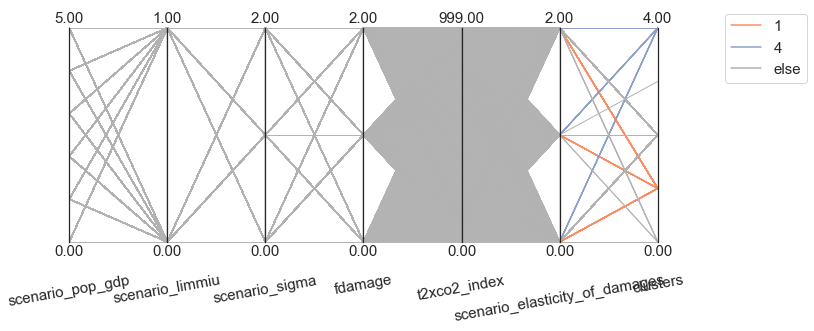

In [128]:
uncertainties_of_interest = ["scenario_pop_gdp","scenario_limmiu","scenario_sigma",
                 "fdamage","t2xco2_index","scenario_elasticity_of_damages","clusters"]

input_data = df_to_plot[uncertainties_of_interest]

paraxes = parcoords.ParallelAxes(parcoords.get_limits(input_data), rot=10,fontsize=15)
paraxes.fig.set_size_inches(10,5)
    
for cluster in dict_to_graph['Population under treshold Suff_policy30']:
    print(cluster)
    if cluster == dict_to_graph['Population under treshold Suff_policy30'][0]:
        paraxes.plot(input_data[input_data['clusters']==cluster]
                     ,linewidth=1, color=sns.color_palette("Set2")[1], label=cluster)
    if cluster == dict_to_graph['Population under treshold Suff_policy30'][1]:
        paraxes.plot(input_data[input_data['clusters']==cluster]
                     ,linewidth=1, color=sns.color_palette("Set2")[2], label=cluster)
        
other_clusters = list(set(list_total) - set(dict_to_graph['Population under treshold Suff_policy30']))
paraxes.plot(input_data[input_data['clusters'].isin(other_clusters)],linewidth=1, 
             color=sns.color_palette("Set2")[7], label="else")
        
paraxes.legend()

plt.show()


# Customizable ema plotting

Cluster based on temperature outcomes

In [155]:
sns.set_style("whitegrid")

sns.set_context( rc={
    "axes.titlesize" : 24,
    "axes.labelsize" : 20,
    "xtick.labelsize" : 18,
    "ytick.labelsize" : 18,
    "legend.fontsize": 16})

## Egalitarian policies

In [156]:
idx = pd.IndexSlice

#sns.set(font_scale=1.40, style='whitegrid')
timepoints_to_save = np.arange(2005,2105+10,10)

cluster_index = 0

objectives_list_timeseries_name =  ['Atmospheric Temperature ','Lowest income per capita ', "Damages ",
                                    'Highest climate impact per capita ','Population under treshold ',
                                    'Total Output ',"Industrial Emission ","Intratemporal impact GINI ",
                                    'Intratemporal utility GINI ']

objectives_labels = ["Atmospheric warming (°C)","Worst-off consumption ($k)","Global damages ($ trillion)",
                     "Relative climate impact (%)","Population treshold (million)","Global output ($ trillion)",
                     "Global Emissions (Gt CO2)","Regional impact inequality (GINI)","Regional consumption inequality (GINI)"]

policy_list = ["Egal_policy14","Egal_policy42"]
cluster_objective =  'Atmospheric Temperature '

#determine for each policy the clusters based on the cluster objective
for policy in policy_list:
    name = cluster_objective + policy
    
    outcomes =[]
    for year in timepoints_to_save:
        name_year = cluster_objective + str(year)
        outcomes.append(name_year)

    cluster_df = pd.DataFrame()

    cluster_df = pd.DataFrame(data = outcome_dict[name],columns = outcomes )
    cluster_df["clusters"] = ""
    
    #Assign clustering based on temperature
    if (policy == "Nord_nordhaus") or (policy == "Egal_policy14") or (policy == "Egal_policy36"):
        if cluster_objective == "Atmospheric Temperature ":

            #split 4 clusters without behaviour
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] > 5), 5, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 2.5), 4, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 2.5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1.5), 3, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1.5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1), 2, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1) &
                                      (cluster_df['Atmospheric Temperature 2105'] > -0.01), 1, inplace=True)
            
    if (policy == "Prio_policy19") or (policy == "Suff_policy30") :
        if cluster_objective == "Atmospheric Temperature ":

            #split 4 clusters without behaviour
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] > 3), 5, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 3) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 2.0), 4, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 2.0) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1.5), 3, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1.5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1), 2, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1) &
                                      (cluster_df['Atmospheric Temperature 2105'] > -0.01), 1, inplace=True)
            
    #cluster_df = cluster_df.set_index(['scenario'])[["clusters"]]
    
    #make graphs for each of those clusters (clusters are consistent within each graph)
    label_index = 0
    for objective in objectives_list_timeseries_name:
        if policy == "Prio_policy19" and  objective == "Intratemporal impact GINI ":
            check_1 = True
            print("check1")
        else :
            check_1 = False
            
        if policy == "Prio_policy19" and objective == 'Intratemporal utility GINI ':
            check_2 = True
            print("check2")
        else:
            check_2 = False
        
        if check_1 == False and check_2 == False:
            print("drawing " + str(objective) + " " + str(policy))          
            
            #set name of the outcome dict key
            objective_name = objective+policy
            print(objective_name)

            #get outcome columns to plot (per year)
            outcomes =[]
            for year in timepoints_to_save:
                name_year = objective + str(year)
                outcomes.append(name_year)

            #get outcome dataframe
            df_total = pd.DataFrame(data = outcome_dict[objective_name],columns = outcomes )

            cluster_index = 0
            #set up input data file for the seaborn lineplot
            input_data = df_total[outcomes]
            input_data = input_data.stack().to_frame().reset_index()
            input_data.columns = ["index","Year","Value"]
            input_data["Year"] = input_data["Year"].str[-4:]
            input_data = input_data.set_index(["index"])
            input_data['clusters'] = input_data.index.map(cluster_df['clusters'])
            input_data["Year"] = input_data["Year"].astype(int)

            if policy == "Prio_policy19":
                input_data["cluster_label"] = ""
                input_data.loc[input_data["clusters"] == 5,'cluster_label'] = "E: Warming above 3 C"
                input_data.loc[input_data["clusters"] == 4,'cluster_label'] = "D: Warming between 2 and 3 C"
                input_data.loc[input_data["clusters"] == 3,'cluster_label'] = "C: Warming between 1.5 and 2 C"
                input_data.loc[input_data["clusters"] == 2,'cluster_label'] = "B: Warming between 1.0 and 1.5 C"
                input_data.loc[input_data["clusters"] == 1,'cluster_label'] = "A: Warming below 1.0 C"

            if policy == "Suff_policy30": 
                input_data["cluster_label"] = ""
                input_data.loc[input_data["clusters"] == 5,'cluster_label'] = "E: Warming above 3 C"
                input_data.loc[input_data["clusters"] == 4,'cluster_label'] = "D: Warming between 2 and 3 C"
                input_data.loc[input_data["clusters"] == 3,'cluster_label'] = "C: Warming between 1.5 and 2 C"
                input_data.loc[input_data["clusters"] == 2,'cluster_label'] = "B: Warming between 1.0 and 1.5 C"
                input_data.loc[input_data["clusters"] == 1,'cluster_label'] = "A: Warming below 1.0 C"

            if (policy == "Nord_nordhaus") or (policy == "Egal_policy14") or (policy == "Egal_policy36"): 
                input_data["cluster_label"] = ""
                input_data.loc[input_data["clusters"] == 5,'cluster_label'] = "E: Warming above 5 C"
                input_data.loc[input_data["clusters"] == 4,'cluster_label'] = "D: Warming between 2.5 and 5 C"
                input_data.loc[input_data["clusters"] == 3,'cluster_label'] = "C: Warming between 1.5 and 2.5 C"
                input_data.loc[input_data["clusters"] == 2,'cluster_label'] = "B: Warming between 1.0 and 1.5 C"
                input_data.loc[input_data["clusters"] == 1,'cluster_label'] = "A: Warming below 1.0 C"


            #set index of descriptive table and plot table to match clusters
            years = [2075,2105]
            get_list = []

            for year in years:
                outcome = objective + str(year)
                get_list.append(outcome)

            #get right labels
            #df_total = df_total.sort_values(by=["scenario"])
            df_total['cluster_label'] = input_data[input_data["Year"]==2105].sort_values(
                by=["index"])["cluster_label"].str[0:1]

            #get statistics
            describe = df_total.groupby(['cluster_label'])[get_list].describe()
            incidence = df_total.groupby(['cluster_label'])[get_list].count()
            describe = describe.T
            cluster_index =  cluster_index + 1

            #only select mean and count
            mean = describe.loc[idx[:, 'mean'], :]
            count = describe.loc[idx[:, 'count'], :]

            count = count.reset_index()
            count["index"] = count.iloc[:,1] +" " + count.iloc[:,0].str[-4:]
            count = count.iloc[:,2:]
            count = count.set_index(count.columns[-1])

            mean = mean.reset_index()
            mean["index"] = mean.iloc[:,1] +" " + mean.iloc[:,0].str[-4:]
            mean = mean.iloc[:,2:]
            mean = mean.set_index(mean.columns[-1])

            #get color palettes for clusters
            cluster_list = list(input_data["cluster_label"].unique())
            cluster_list_1 = list(cluster_df["clusters"].unique())
            cluster_list.sort()

            colors = {}
            for i in range(0,len(cluster_list)):
                colors[cluster_list[i]] = sns.color_palette("rocket")[i]

            #build gridspec
            fig = plt.figure(constrained_layout=False,figsize=(10,10))
            gs = fig.add_gridspec(26,18)
            ax1 = fig.add_subplot(gs[0:15, 0:14])
            ax3 = fig.add_subplot(gs[0:15, 16:18])

            ax2 = fig.add_subplot(gs[18:22, 1:10])
            ax4 = fig.add_subplot(gs[22:26, 1:10])

            #draw individual plots on the right axis
            input_data.rename(columns={'Value':objective}, inplace=True)

            k = sns.lineplot(data=input_data, x="Year", y=objective, hue="cluster_label",legend= False,ci=None,
                             units = input_data.index,estimator=None,ax = ax1,palette=colors,linewidth = 0.8)
            k.set(ylabel = objectives_labels[label_index])

            input_data["id"] = "clusters"

            sns.boxplot(data = input_data[input_data["Year"]==2105],x="id",y= objective,hue = "cluster_label",
                        hue_order = cluster_list,ax= ax3,palette=colors)
            
            ax3.set(ylabel = objectives_labels[label_index])

            ax3.legend(bbox_to_anchor=(1, -0.25),borderaxespad=0,fontsize = 12.5)
            ax3.set_xlabel('')

            map1 = sns.heatmap(count,annot=True,fmt='.2f',cbar=False,cmap="Blues",
                        annot_kws={"fontsize":12},ax = ax2)
            map1.set_yticklabels(['Count 2075','Count 2105'], rotation=0,fontsize=13)
            map1.set_ylabel('')    
            map1.set_xlabel('')    

            map2 = sns.heatmap(mean,annot=True,fmt='.2f',cbar=False,cmap="Blues",
                        annot_kws={"fontsize":12},ax = ax4)
            map2.set_yticklabels(['Mean 2075','Mean 2105'], rotation=0,fontsize=13)
            map2.set_ylabel('')    
            map2.set_xlabel('cluster label')    
        
            ax1.set(ylim=((input_data[objective].min()+input_data[objective].min()*0.10), 
                          (input_data[objective].max()+input_data[objective].max()*0.10)))
            ax3.set(ylim=((input_data[objective].min()+input_data[objective].min()*0.10), 
                          (input_data[objective].max()+input_data[objective].max()*0.10)))
            ax1.set(xlim=(2005,2105))
            label_index = label_index + 1

            plt.show()
            fig.savefig("Clustering_plot" + objective + policy + ".png" ,dpi = 200,bbox_inches ="tight")

KeyError: 'Atmospheric Temperature Egal_policy14'

## Non egalitarian policies

drawing Atmospheric Temperature  Prio_policy19
Atmospheric Temperature Prio_policy19


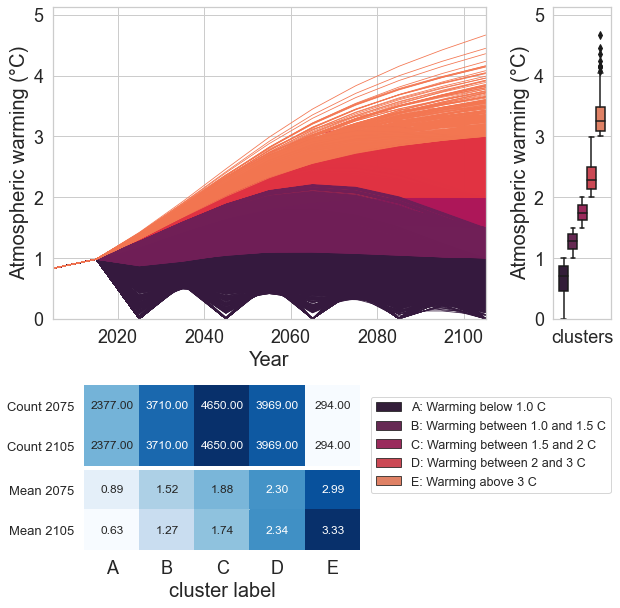

drawing Lowest income per capita  Prio_policy19
Lowest income per capita Prio_policy19


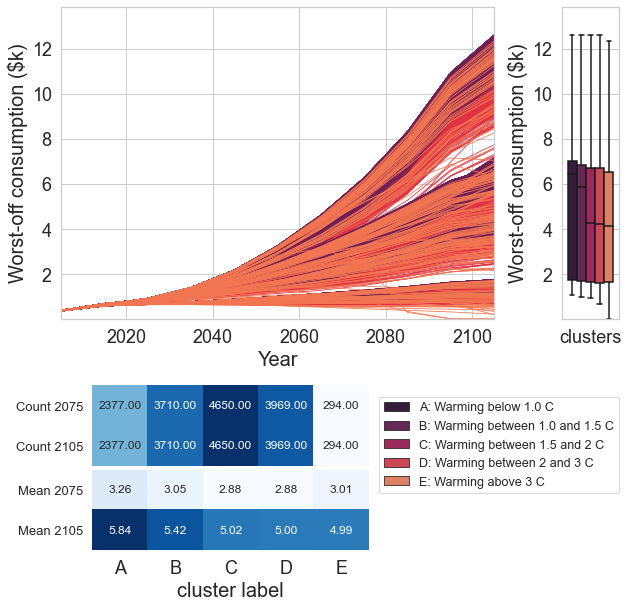

drawing Damages  Prio_policy19
Damages Prio_policy19


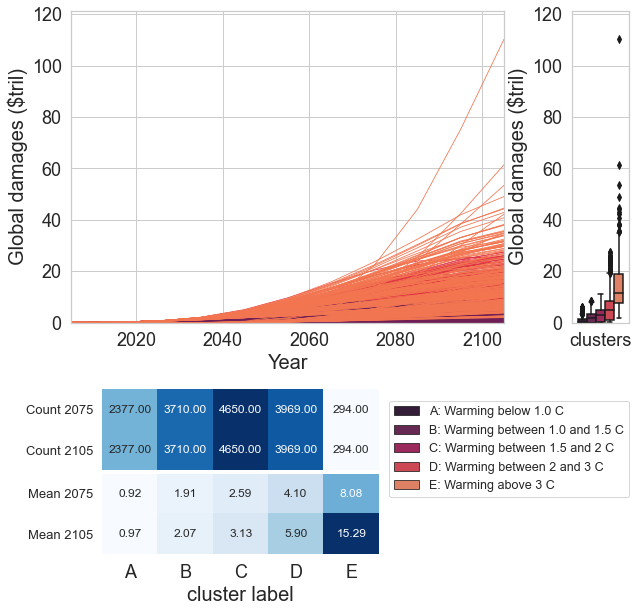

drawing Highest climate impact per capita  Prio_policy19
Highest climate impact per capita Prio_policy19


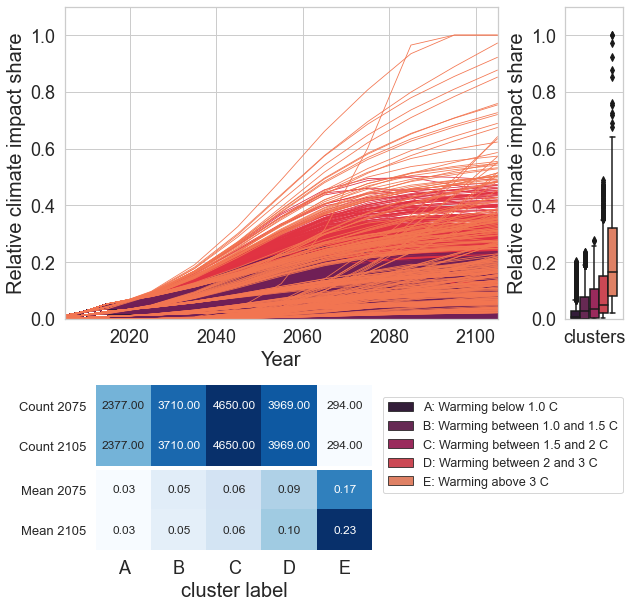

drawing Population under treshold  Prio_policy19
Population under treshold Prio_policy19


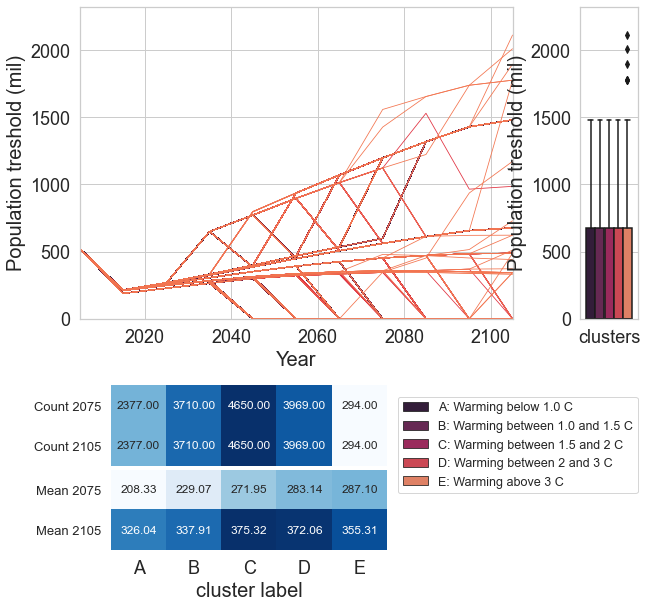

drawing Total Output  Prio_policy19
Total Output Prio_policy19


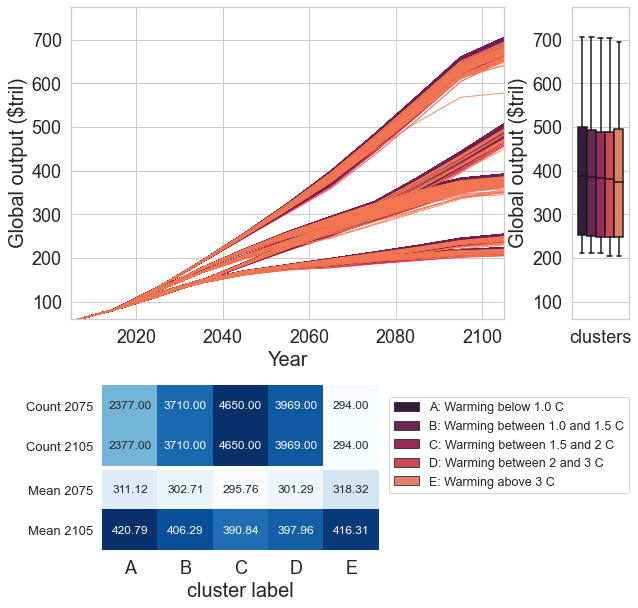

drawing Industrial Emission  Prio_policy19
Industrial Emission Prio_policy19


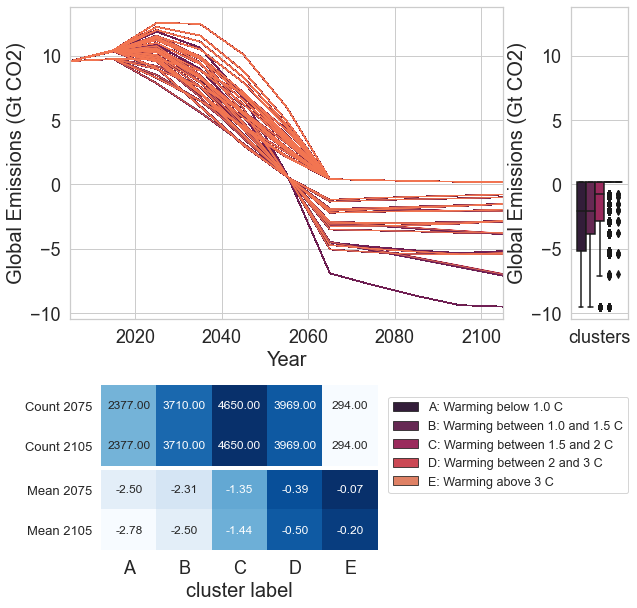

check1
check2
drawing Atmospheric Temperature  Suff_policy30
Atmospheric Temperature Suff_policy30


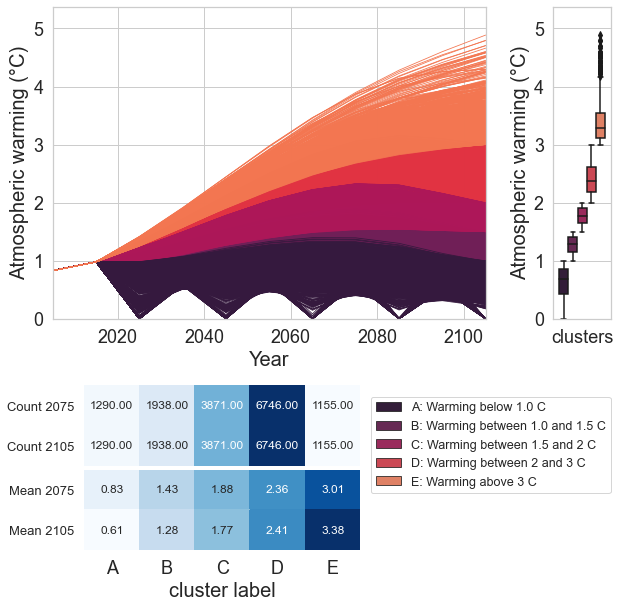

drawing Lowest income per capita  Suff_policy30
Lowest income per capita Suff_policy30


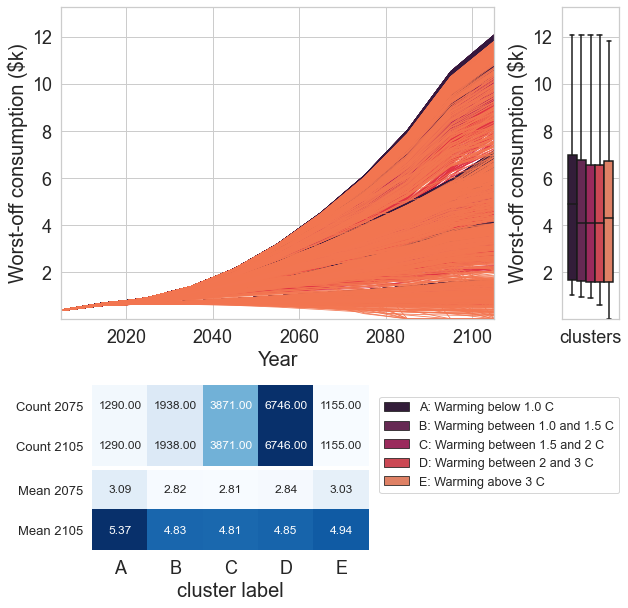

drawing Damages  Suff_policy30
Damages Suff_policy30


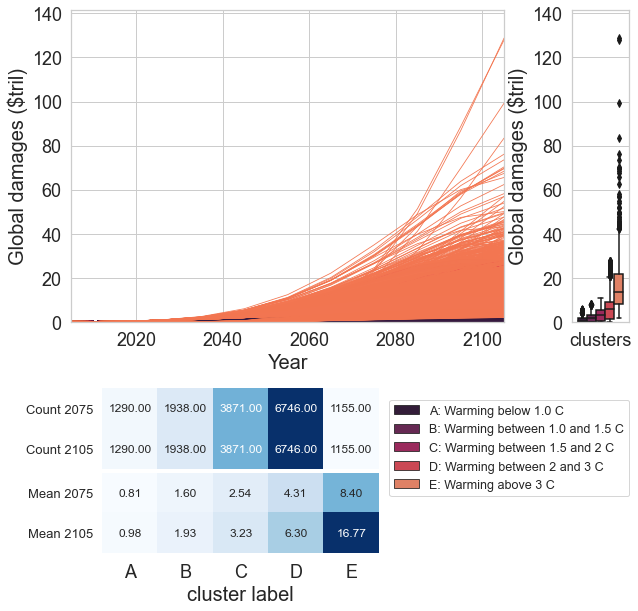

drawing Highest climate impact per capita  Suff_policy30
Highest climate impact per capita Suff_policy30


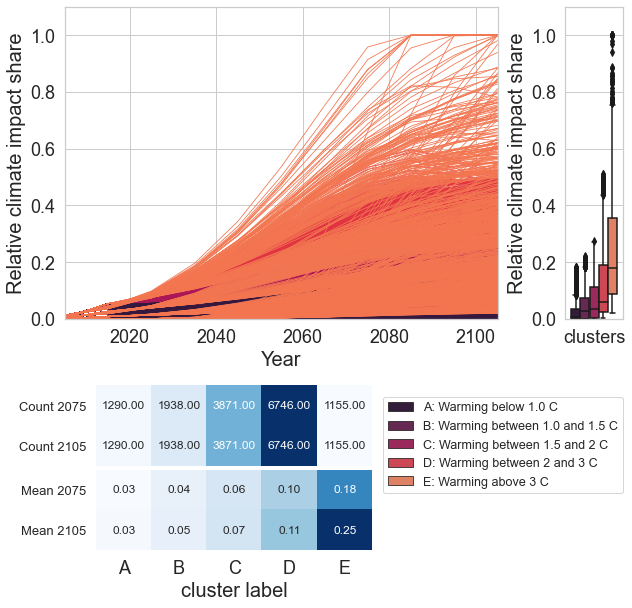

drawing Population under treshold  Suff_policy30
Population under treshold Suff_policy30


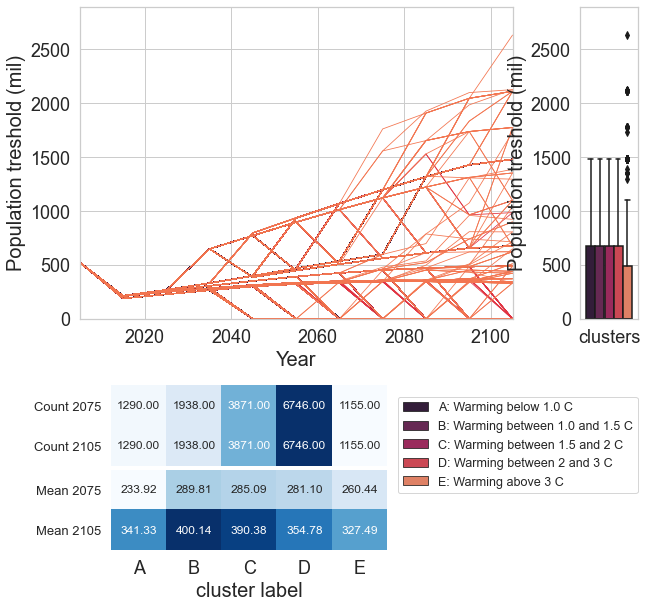

drawing Total Output  Suff_policy30
Total Output Suff_policy30


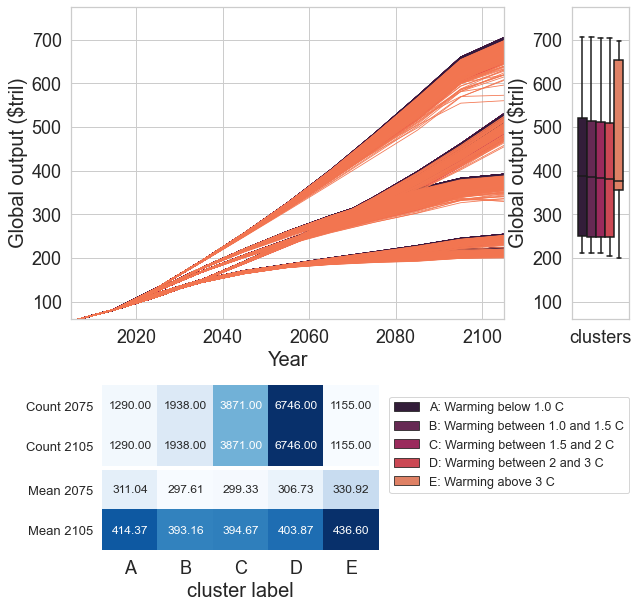

drawing Industrial Emission  Suff_policy30
Industrial Emission Suff_policy30


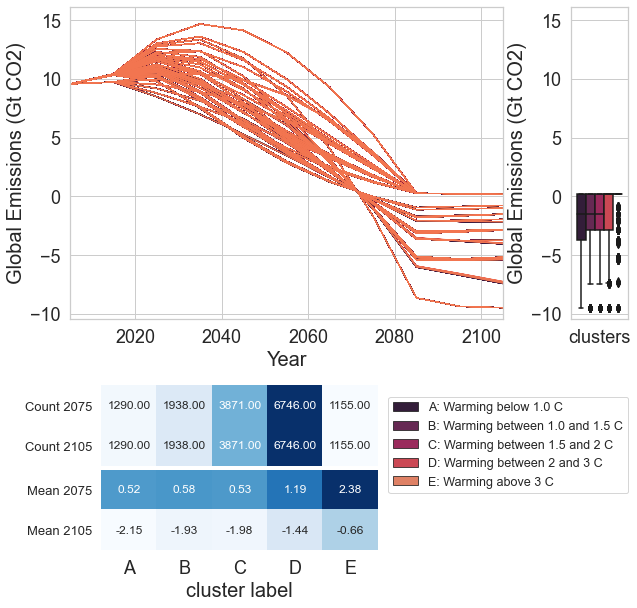

drawing Intratemporal impact GINI  Suff_policy30
Intratemporal impact GINI Suff_policy30


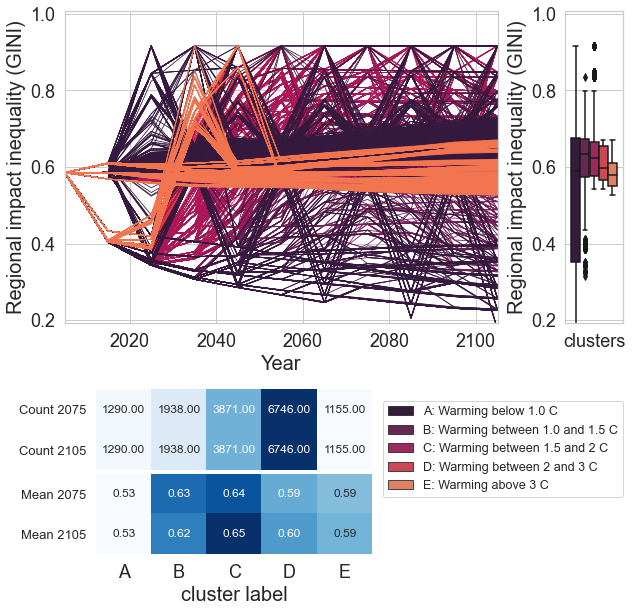

drawing Intratemporal utility GINI  Suff_policy30
Intratemporal utility GINI Suff_policy30


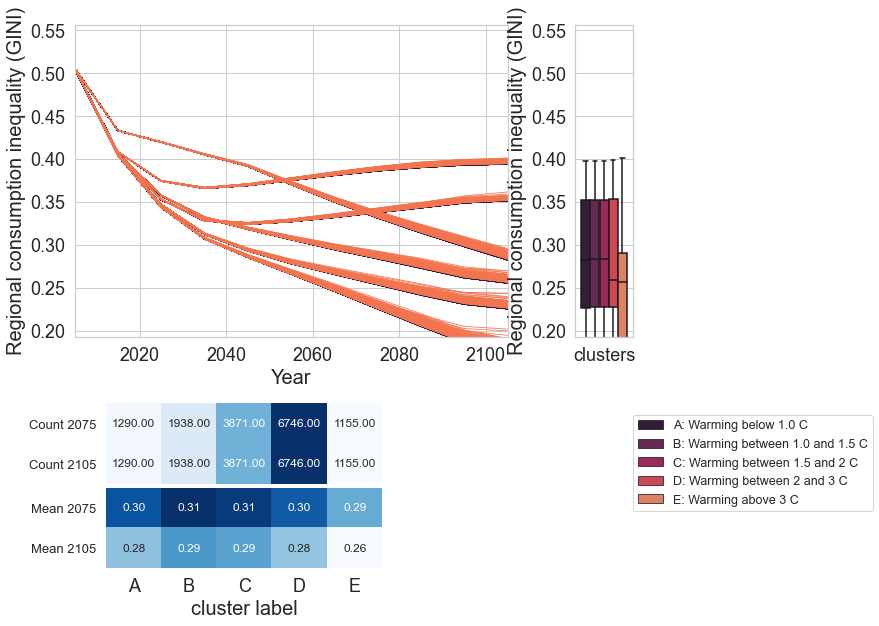

drawing Atmospheric Temperature  Nord_nordhaus
Atmospheric Temperature Nord_nordhaus


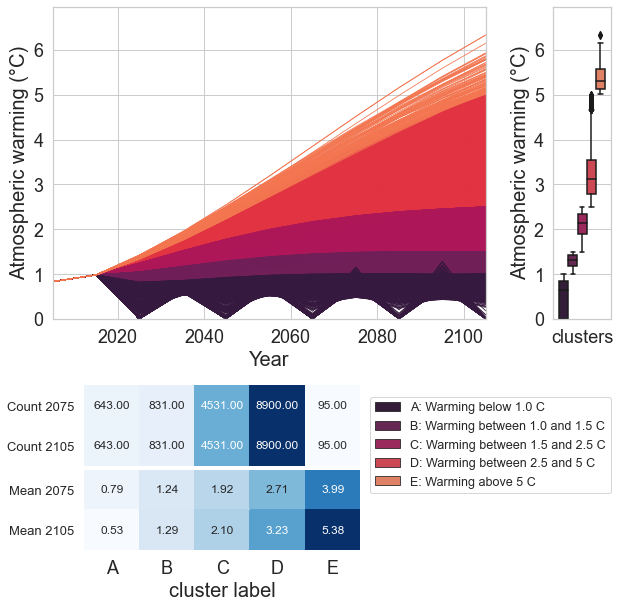

drawing Lowest income per capita  Nord_nordhaus
Lowest income per capita Nord_nordhaus


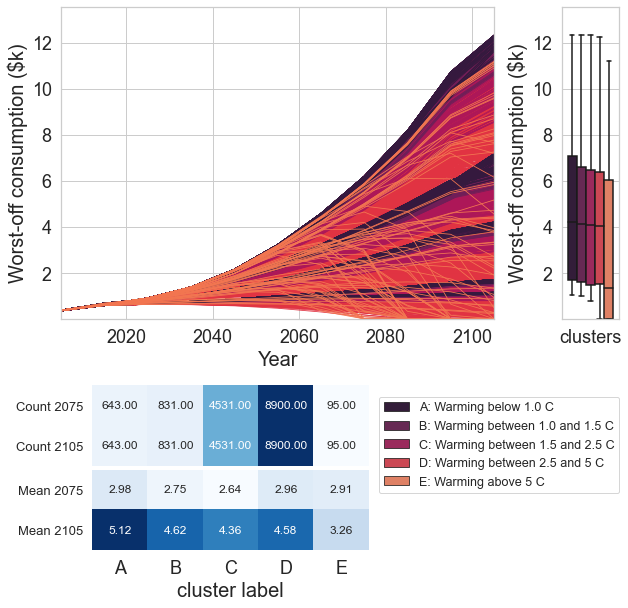

drawing Damages  Nord_nordhaus
Damages Nord_nordhaus


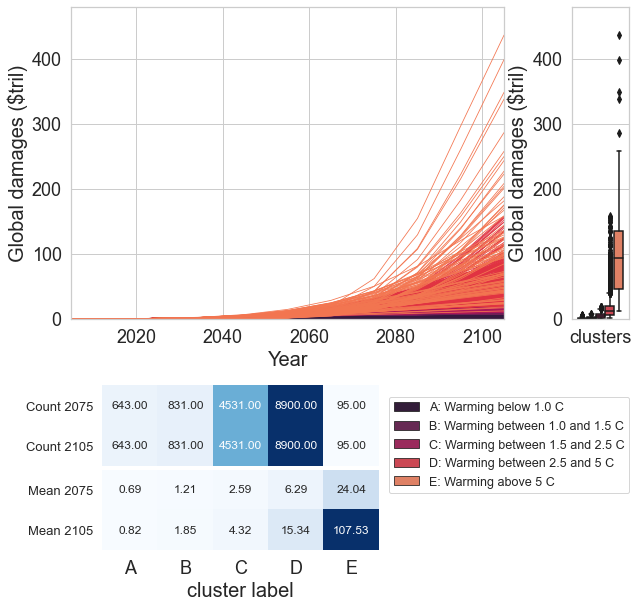

drawing Highest climate impact per capita  Nord_nordhaus
Highest climate impact per capita Nord_nordhaus


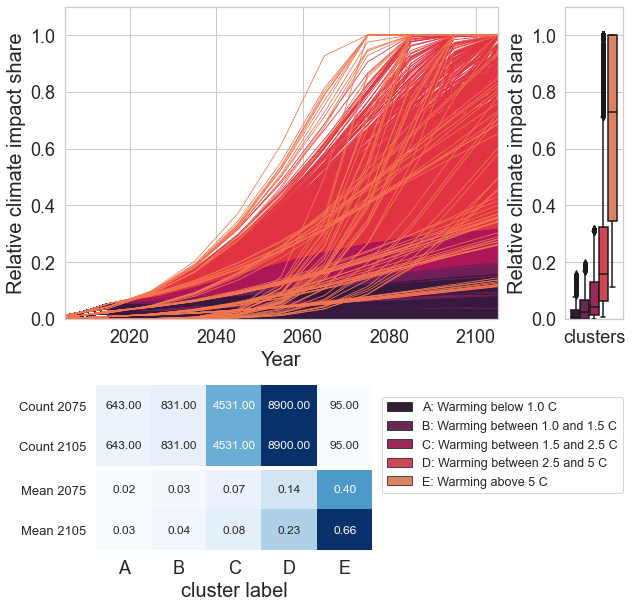

drawing Population under treshold  Nord_nordhaus
Population under treshold Nord_nordhaus


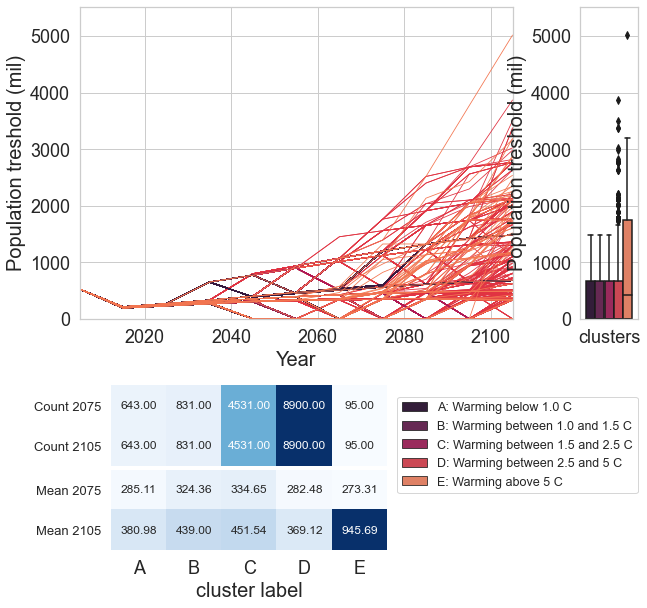

drawing Total Output  Nord_nordhaus
Total Output Nord_nordhaus


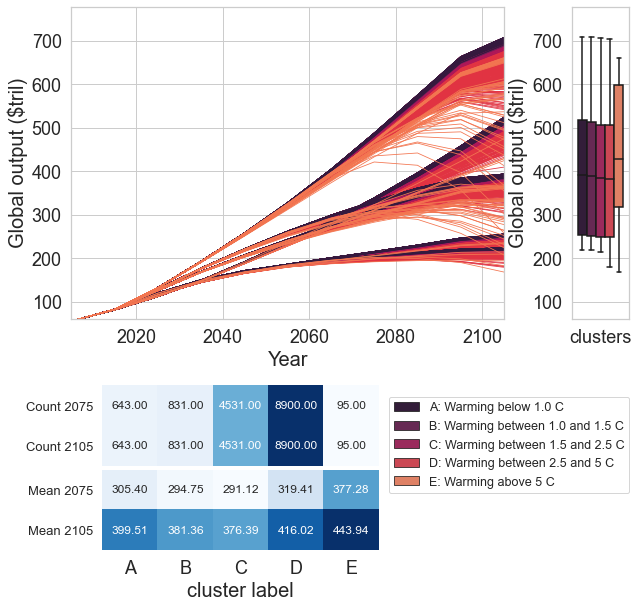

drawing Industrial Emission  Nord_nordhaus
Industrial Emission Nord_nordhaus


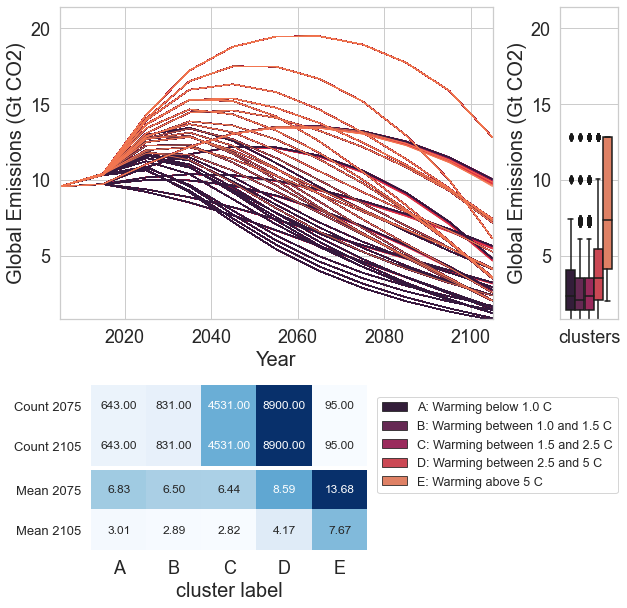

drawing Intratemporal impact GINI  Nord_nordhaus
Intratemporal impact GINI Nord_nordhaus


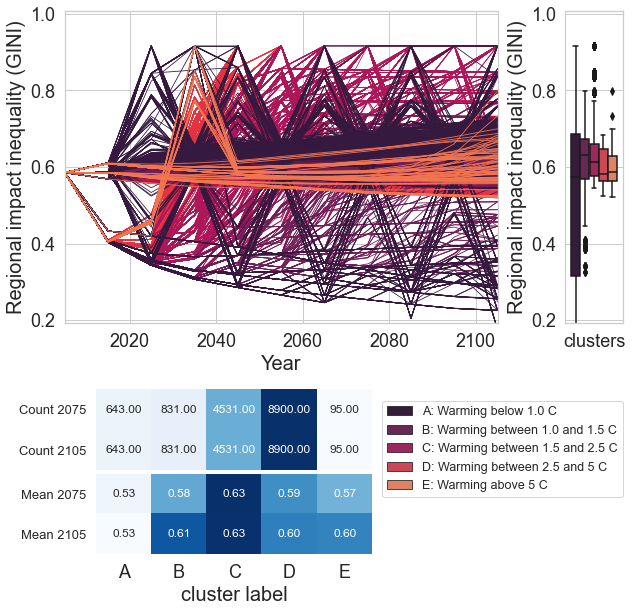

drawing Intratemporal utility GINI  Nord_nordhaus
Intratemporal utility GINI Nord_nordhaus


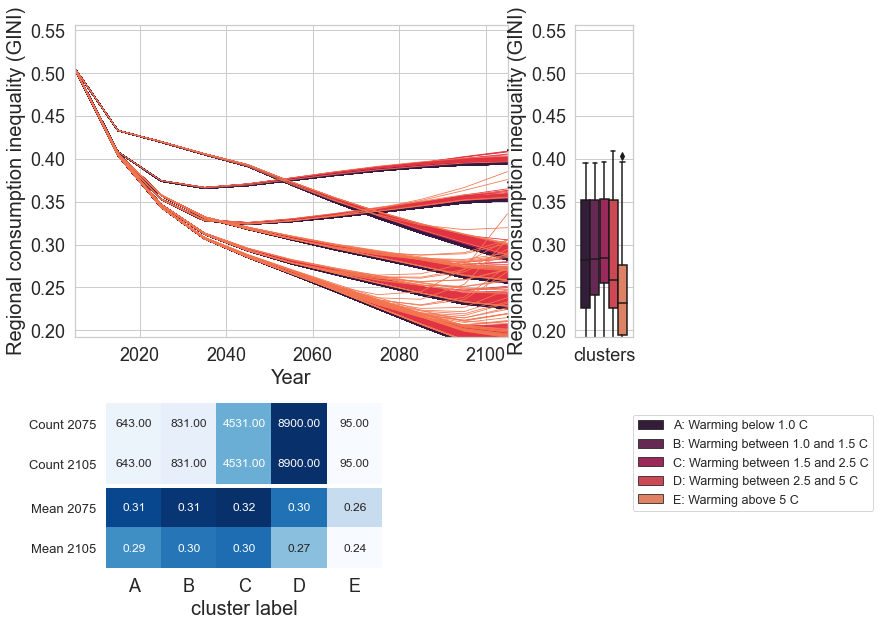

In [169]:
idx = pd.IndexSlice

#sns.set(font_scale=1.40, style='whitegrid')
timepoints_to_save = np.arange(2005,2105+10,10)

cluster_index = 0

objectives_list_timeseries_name =  ['Atmospheric Temperature ','Lowest income per capita ', "Damages ",
                                    'Highest climate impact per capita ','Population under treshold ',
                                    'Total Output ',"Industrial Emission ","Intratemporal impact GINI ",
                                    'Intratemporal utility GINI ']

objectives_labels = ["Atmospheric warming (°C)","Worst-off consumption ($k)","Global damages ($tril)",
                     "Relative climate impact share","Population treshold (mil)","Global output ($tril)",
                     "Global Emissions (Gt CO2)","Regional impact inequality (GINI)","Regional consumption inequality (GINI)"]

policy_list = ["Prio_policy19","Suff_policy30","Nord_nordhaus"]
cluster_objective =  'Atmospheric Temperature '

#determine for each policy the clusters based on the cluster objective
for policy in policy_list:
    name = cluster_objective + policy
    
    #get cluster information based on specified objective above
    cluster_df = pd.read_csv("TSC_35k_" + cluster_objective + "_"+ policy + "_cluster_" + str(5) + ".csv")
    cluster_df = cluster_df.iloc[:,1:]
    cluster_df = cluster_df.drop(["model"],axis=1)

    outcomes =[]
    for year in timepoints_to_save:
        name_year = cluster_objective + str(year)
        outcomes.append(name_year)

    df = pd.DataFrame()

    df = pd.DataFrame(data = outcome_dict[name],columns =outcomes )
    cluster_df = pd.concat([df,cluster_df],axis=1)

    #correct Nordhaus clusters
    if policy == "Nord_nordhaus":
        if cluster_objective == "Atmospheric Temperature ":

            #split 4 clusters without behaviour
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] > 5), 5, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 2.5), 4, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 2.5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1.5), 3, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1.5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1), 2, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1) &
                                      (cluster_df['Atmospheric Temperature 2105'] > -0.01), 1, inplace=True)
            
    if (policy == "Prio_policy19") or (policy == "Suff_policy30") :
        if cluster_objective == "Atmospheric Temperature ":

            #split 4 clusters without behaviour
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] > 3), 5, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 3) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 2.0), 4, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 2.0) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1.5), 3, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1.5) &
                                      (cluster_df['Atmospheric Temperature 2105'] > 1), 2, inplace=True)
            cluster_df['clusters'].mask((cluster_df['Atmospheric Temperature 2105'] < 1) &
                                      (cluster_df['Atmospheric Temperature 2105'] > -0.01), 1, inplace=True)
            
    cluster_df = cluster_df.set_index(['scenario'])[["clusters"]]
    
    #make graphs for each of those clusters (clusters are consistent within each graph)
    label_index = 0
    for objective in objectives_list_timeseries_name:
        if policy == "Prio_policy19" and  objective == "Intratemporal impact GINI ":
            check_1 = True
            print("check1")
        else :
            check_1 = False
            
        if policy == "Prio_policy19" and objective == 'Intratemporal utility GINI ':
            check_2 = True
            print("check2")
        else:
            check_2 = False
        
        if check_1 == False and check_2 == False:
            print("drawing " + str(objective) + " " + str(policy))
            #get non outcome data from the cluster files
            df_to_plot = pd.read_csv("TSC_35k_" + objective + "_"+ policy + "_cluster_" + str(5) + ".csv")
            df_to_plot = df_to_plot.iloc[:,1:]
            df_to_plot = df_to_plot.set_index(['scenario'])
            df_to_plot = df_to_plot.drop(["model"],axis=1)

            #set name of the outcome dict key
            objective_name = objective+policy
            print(objective_name)

            #get outcome columns to plot (per year)
            outcomes =[]
            for year in timepoints_to_save:
                name_year = objective + str(year)
                outcomes.append(name_year)

            #get outcome dataframe
            df = pd.DataFrame(data = outcome_dict[objective_name],columns =outcomes,index = df_to_plot.index )

            #merge outcome and cluster data based on unique scenario index
            df_total = pd.concat([df,df_to_plot],axis=1)
            cluster_index = 0
            #set up input data file for the seaborn lineplot
            input_data = df_total[outcomes]
            input_data = input_data.stack().to_frame().reset_index()
            input_data.columns = ["index","Year","Value"]
            input_data["Year"] = input_data["Year"].str[-4:]
            input_data = input_data.set_index(["index"])
            input_data['clusters'] = input_data.index.map(cluster_df['clusters'])
            input_data["Year"] = input_data["Year"].astype(int)

            if policy == "Prio_policy19":
                input_data["cluster_label"] = ""
                input_data.loc[input_data["clusters"] == 5,'cluster_label'] = "E: Warming above 3 C"
                input_data.loc[input_data["clusters"] == 4,'cluster_label'] = "D: Warming between 2 and 3 C"
                input_data.loc[input_data["clusters"] == 3,'cluster_label'] = "C: Warming between 1.5 and 2 C"
                input_data.loc[input_data["clusters"] == 2,'cluster_label'] = "B: Warming between 1.0 and 1.5 C"
                input_data.loc[input_data["clusters"] == 1,'cluster_label'] = "A: Warming below 1.0 C"

            if policy == "Suff_policy30": 
                input_data["cluster_label"] = ""
                input_data.loc[input_data["clusters"] == 5,'cluster_label'] = "E: Warming above 3 C"
                input_data.loc[input_data["clusters"] == 4,'cluster_label'] = "D: Warming between 2 and 3 C"
                input_data.loc[input_data["clusters"] == 3,'cluster_label'] = "C: Warming between 1.5 and 2 C"
                input_data.loc[input_data["clusters"] == 2,'cluster_label'] = "B: Warming between 1.0 and 1.5 C"
                input_data.loc[input_data["clusters"] == 1,'cluster_label'] = "A: Warming below 1.0 C"

            if policy == "Nord_nordhaus": 
                input_data["cluster_label"] = ""
                input_data.loc[input_data["clusters"] == 5,'cluster_label'] = "E: Warming above 5 C"
                input_data.loc[input_data["clusters"] == 4,'cluster_label'] = "D: Warming between 2.5 and 5 C"
                input_data.loc[input_data["clusters"] == 3,'cluster_label'] = "C: Warming between 1.5 and 2.5 C"
                input_data.loc[input_data["clusters"] == 2,'cluster_label'] = "B: Warming between 1.0 and 1.5 C"
                input_data.loc[input_data["clusters"] == 1,'cluster_label'] = "A: Warming below 1.0 C"


            #set index of descriptive table and plot table to match clusters
            years = [2075,2105]
            get_list = []

            for year in years:
                outcome = objective + str(year)
                get_list.append(outcome)

            #get right labels
            df_total = df_total.sort_values(by=["scenario"])
            df_total['cluster_label'] = input_data[input_data["Year"]==2105].sort_values(
                by=["index"])["cluster_label"].str[0:1]

            #get statistics
            describe = df_total.groupby(['cluster_label'])[get_list].describe()
            incidence = df_total.groupby(['cluster_label'])[get_list].count()
            describe = describe.T
            cluster_index =  cluster_index + 1

            #only select mean and count
            mean = describe.loc[idx[:, 'mean'], :]
            count = describe.loc[idx[:, 'count'], :]

            count = count.reset_index()
            count["index"] = count.iloc[:,1] +" " + count.iloc[:,0].str[-4:]
            count = count.iloc[:,2:]
            count = count.set_index(count.columns[-1])

            mean = mean.reset_index()
            mean["index"] = mean.iloc[:,1] +" " + mean.iloc[:,0].str[-4:]
            mean = mean.iloc[:,2:]
            mean = mean.set_index(mean.columns[-1])

            #get color palettes for clusters
            cluster_list = list(input_data["cluster_label"].unique())
            cluster_list_1 = list(cluster_df["clusters"].unique())
            cluster_list.sort()

            colors = {}
            for i in range(0,len(cluster_list)):
                colors[cluster_list[i]] = sns.color_palette("rocket")[i]

            #build gridspec
            fig = plt.figure(constrained_layout=False,figsize=(10,10))
            gs = fig.add_gridspec(26,18)
            ax1 = fig.add_subplot(gs[0:15, 0:14])
            ax3 = fig.add_subplot(gs[0:15, 16:18])

            ax2 = fig.add_subplot(gs[18:22, 1:10])
            ax4 = fig.add_subplot(gs[22:26, 1:10])

            #draw individual plots on the right axis
            input_data.rename(columns={'Value':objective}, inplace=True)

            k = sns.lineplot(data=input_data, x="Year", y=objective, hue="cluster_label",legend= False,ci=None,
                             units = input_data.index,estimator=None,ax = ax1,palette=colors,linewidth = 0.8)
            k.set(ylabel = objectives_labels[label_index])

            input_data["id"] = "clusters"

            sns.boxplot(data = input_data[input_data["Year"]==2105],x="id",y= objective,hue = "cluster_label",
                        hue_order = cluster_list,ax= ax3,palette=colors)
            
            ax3.set(ylabel = objectives_labels[label_index])

            ax3.legend(bbox_to_anchor=(1, -0.25),borderaxespad=0,fontsize = 12.5)
            ax3.set_xlabel('')

            map1 = sns.heatmap(count,annot=True,fmt='.2f',cbar=False,cmap="Blues",
                        annot_kws={"fontsize":12},ax = ax2)
            map1.set_yticklabels(['Count 2075','Count 2105'], rotation=0,fontsize=13)
            map1.set_ylabel('')    
            map1.set_xlabel('')    

            map2 = sns.heatmap(mean,annot=True,fmt='.2f',cbar=False,cmap="Blues",
                        annot_kws={"fontsize":12},ax = ax4)
            map2.set_yticklabels(['Mean 2075','Mean 2105'], rotation=0,fontsize=13)
            map2.set_ylabel('')    
            map2.set_xlabel('cluster label')    
        
            ax1.set(ylim=((input_data[objective].min()+input_data[objective].min()*0.10), 
                          (input_data[objective].max()+input_data[objective].max()*0.10)))
            ax3.set(ylim=((input_data[objective].min()+input_data[objective].min()*0.10), 
                          (input_data[objective].max()+input_data[objective].max()*0.10)))
            ax1.set(xlim=(2005,2105))
            label_index = label_index + 1

            plt.show()
            fig.savefig("Clustering_plot" + objective + policy + ".png" ,dpi = 200,bbox_inches ="tight")

## Put graphs together - non egalitarian policies

<ipython-input-170-2e45476d445b>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(constrained_layout=True,figsize=(14,15))


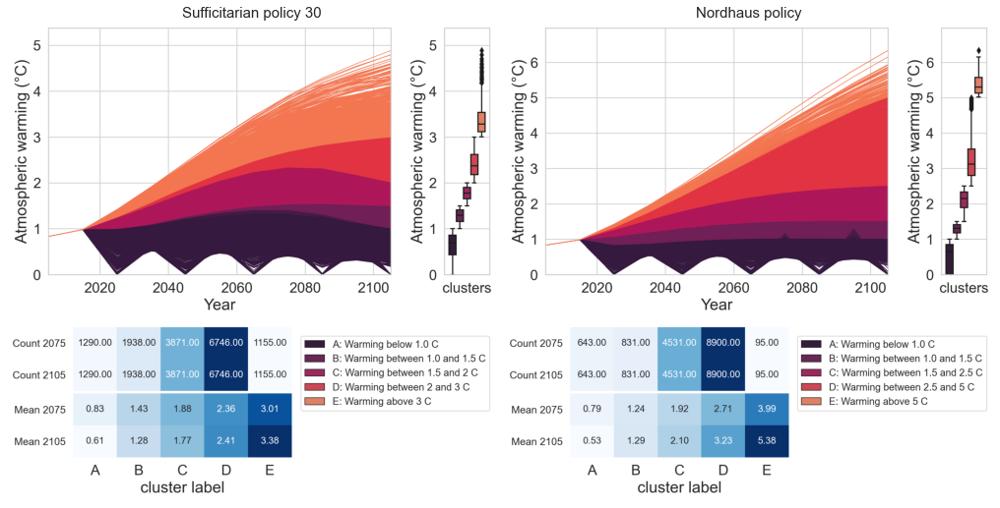

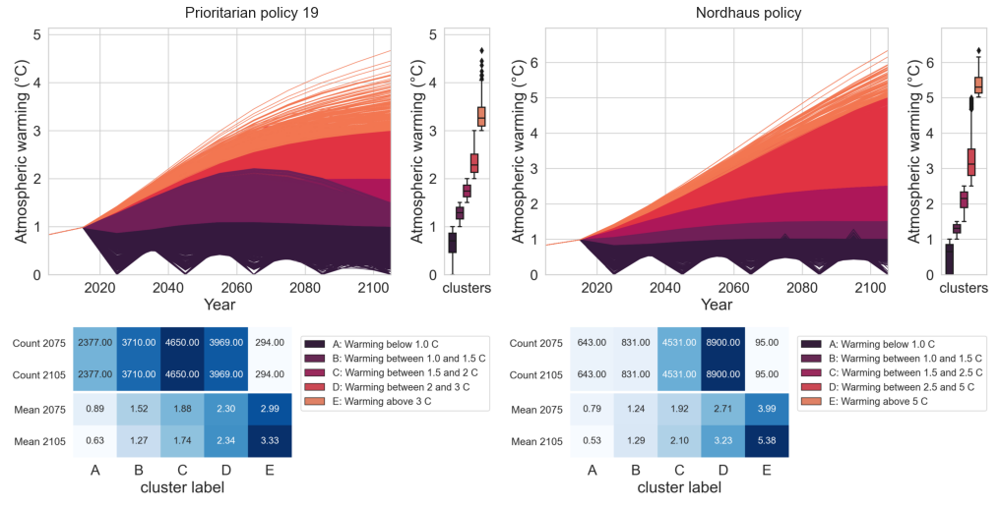

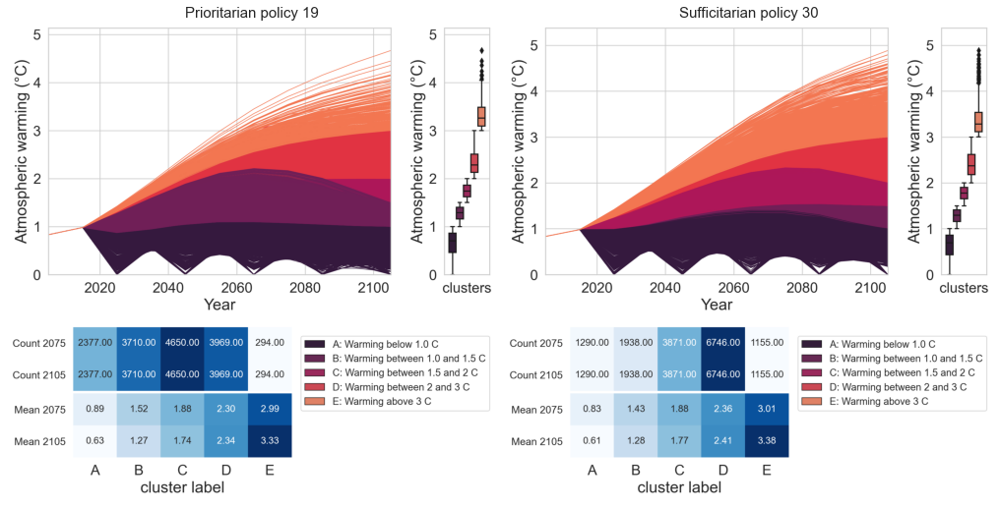

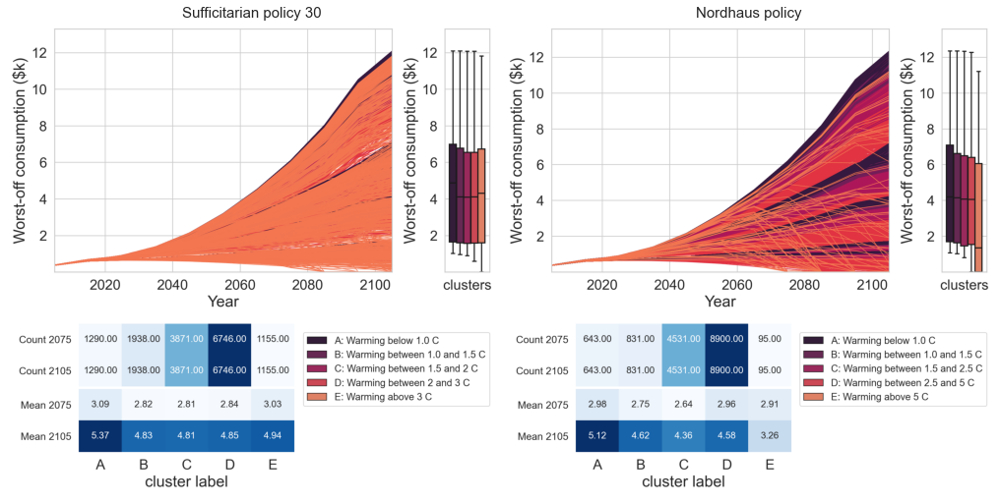

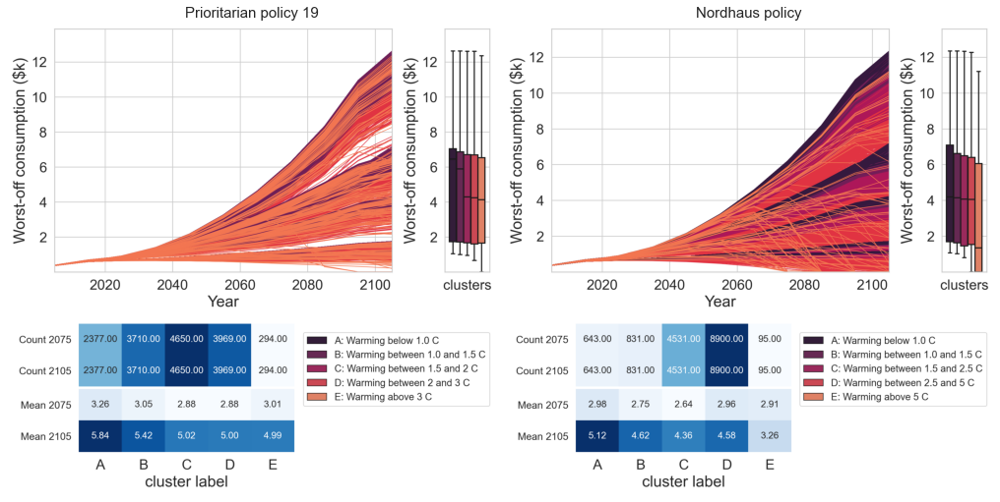

...

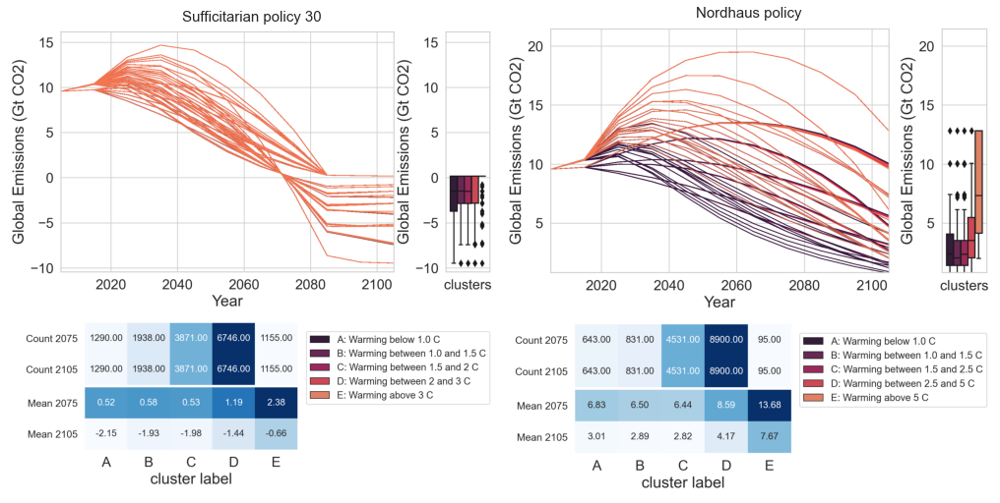

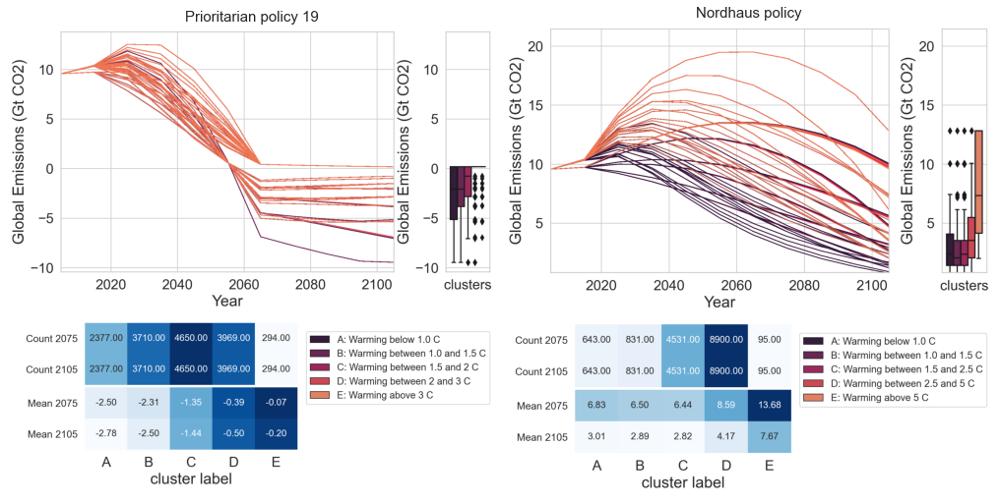

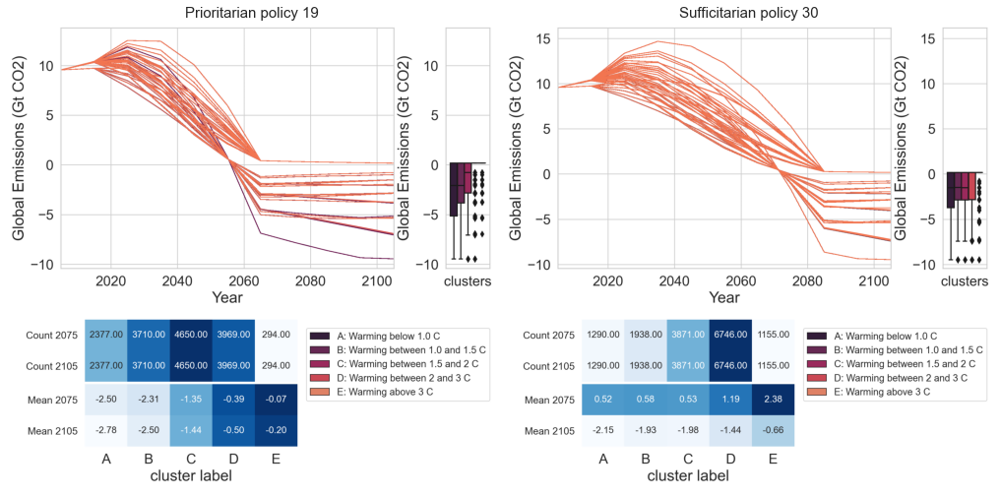

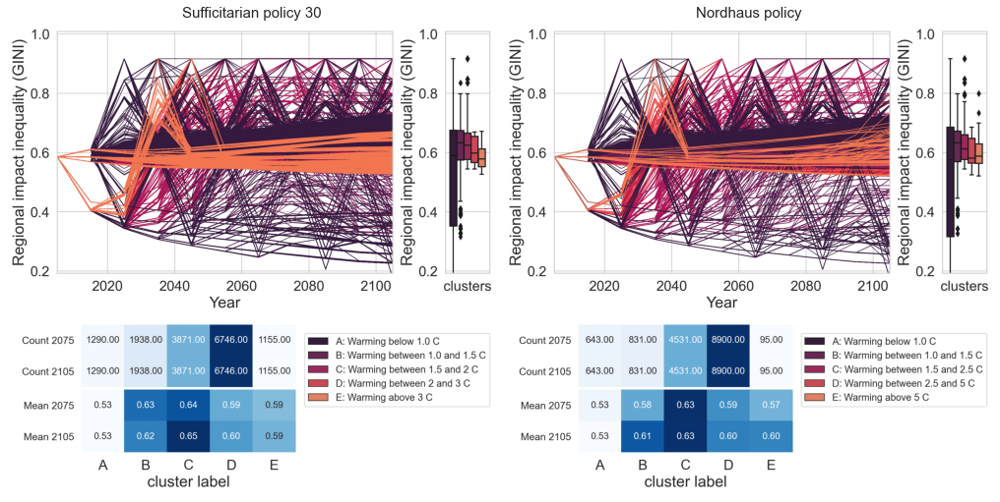

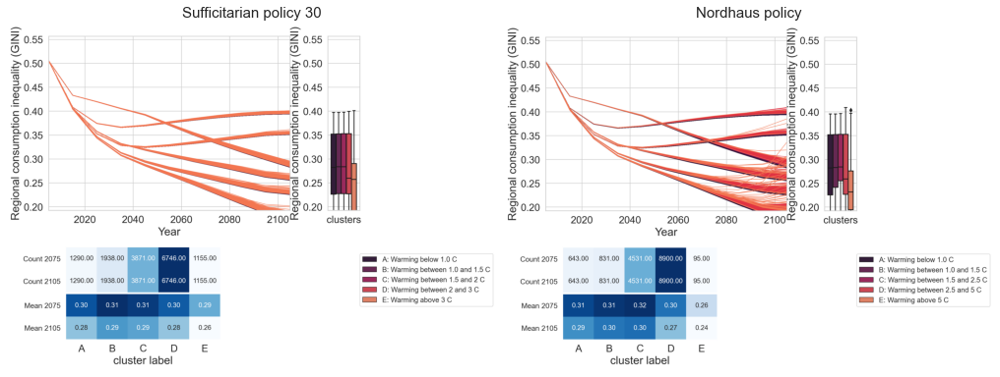

In [170]:
objectives =  ['Atmospheric Temperature ','Lowest income per capita ', "Damages ",
               'Highest climate impact per capita ','Population under treshold ',
               'Total Output ',"Industrial Emission "]

#tupples for comparison plots 
policy_tuples = [(("Suff_policy30","Sufficitarian policy 30"),("Nord_nordhaus","Nordhaus policy")),
                 (("Prio_policy19","Prioritarian policy 19"),("Nord_nordhaus","Nordhaus policy")),
                 (("Prio_policy19","Prioritarian policy 19"),("Suff_policy30","Sufficitarian policy 30"))]

for objective in objectives:  
    for policy_tuple in policy_tuples:
        fig = plt.figure(constrained_layout=True,figsize=(14,15))
        gs = fig.add_gridspec(16,20)
        ax1 = fig.add_subplot(gs[0:16, 0:10],frameon=False)
        ax2 = fig.add_subplot(gs[0:16, 10:20],frameon=False)
        
        ax1.imshow(mpimg.imread("Clustering_plot" + objective + policy_tuple[0][0] + ".png"))
        ax2.imshow(mpimg.imread("Clustering_plot" + objective + policy_tuple[1][0] + ".png"))

        ax1.axes.get_yaxis().set_visible(False)
        ax2.axes.get_yaxis().set_visible(False)

        ax1.axes.get_xaxis().set_visible(False)
        ax2.axes.get_xaxis().set_visible(False)

        ax1.set_title(policy_tuple[0][1],fontdict={'fontsize' : 15}, loc='center')
        ax2.set_title(policy_tuple[1][1],fontdict={'fontsize' : 15}, loc='center')

        fig.savefig("scenario_discovery_plot_" + policy_tuple[0][0] + policy_tuple[1][0] + objective+ "_final.png", dpi=250,bbox_inches='tight')

GINI_objectives = ["Intratemporal impact GINI ", 'Intratemporal utility GINI ']
GINI_policy_tuples = [(("Suff_policy30","Sufficitarian policy 30"),("Nord_nordhaus","Nordhaus policy"))]

for objective in GINI_objectives:  
    for policy_tuple in GINI_policy_tuples:
        fig = plt.figure(constrained_layout=True,figsize=(14,15))
        gs = fig.add_gridspec(16,20)
        ax1 = fig.add_subplot(gs[0:16, 0:10],frameon=False)
        ax2 = fig.add_subplot(gs[0:16, 10:20],frameon=False)
        
        ax1.imshow(mpimg.imread("Clustering_plot" + objective + policy_tuple[0][0] + ".png"))
        ax2.imshow(mpimg.imread("Clustering_plot" + objective + policy_tuple[1][0] + ".png"))

        ax1.axes.get_yaxis().set_visible(False)
        ax2.axes.get_yaxis().set_visible(False)

        ax1.axes.get_xaxis().set_visible(False)
        ax2.axes.get_xaxis().set_visible(False)

        ax1.set_title(policy_tuple[0][1],fontdict={'fontsize' : 15}, loc='center')
        ax2.set_title(policy_tuple[1][1],fontdict={'fontsize' : 15}, loc='center')

        fig.savefig("scenario_discovery_plot_" + policy_tuple[0][0] + policy_tuple[1][0] + objective+ "_final.png", dpi=250,bbox_inches='tight')

# Put graphs together egalitarian policies

In [ ]:
objectives =  ['Atmospheric Temperature ', "Damages ","Intratemporal impact GINI ", 'Intratemporal utility GINI ']
GINI_policy_tuples = [(("Egal_policy14","Egalitarian policy 14"),("Egal_policy42","Egalitarian policy 42"))]

for objective in objectives:  
    for policy_tuple in GINI_policy_tuples:
        fig = plt.figure(constrained_layout=True,figsize=(14,15))
        gs = fig.add_gridspec(16,20)
        ax1 = fig.add_subplot(gs[0:16, 0:10],frameon=False)
        ax2 = fig.add_subplot(gs[0:16, 10:20],frameon=False)
        
        ax1.imshow(mpimg.imread("Clustering_plot" + objective + policy_tuple[0][0] + ".png"))
        ax2.imshow(mpimg.imread("Clustering_plot" + objective + policy_tuple[1][0] + ".png"))

        ax1.axes.get_yaxis().set_visible(False)
        ax2.axes.get_yaxis().set_visible(False)

        ax1.axes.get_xaxis().set_visible(False)
        ax2.axes.get_xaxis().set_visible(False)

        ax1.set_title(policy_tuple[0][1],fontdict={'fontsize' : 15}, loc='center')
        ax2.set_title(policy_tuple[1][1],fontdict={'fontsize' : 15}, loc='center')

        fig.savefig("scenario_discovery_plot_" + policy_tuple[0][0] + policy_tuple[1][0] + objective+ "_final.png", dpi=250,bbox_inches='tight')


# Emission pathways graph

In [30]:
policy_list= ["Prio_policy19","Suff_policy30","Nord_nordhaus","Egal_policy36"]
objectives = ["Industrial Emission ","Atmospheric Temperature "]

outcomes =[]
for objective in objectives:
    for year in timepoints_to_save:

        name_year = objective + str(year)
        outcomes.append(name_year)

categories = ["scenario","scenario_pop_gdp","Economic scenario","scenario_limmiu","principle","policy_recoded", "temperature_label"]
columns = outcomes + categories

In [31]:
df_pathway_graph = results_total_short_term[results_total_short_term["policy_recoded"].isin(policy_list)].iloc[:,1:]

df_pathway_graph["temperature_label"] = ""

df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] > 5), "Warming above 5 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 5) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 3), "Warming between 3 and 5 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 3) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 2),  "Warming between 2 and 3 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 2) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 1.5),  "Warming between 1.5 and 2 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 1.5) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 1), "Warming between 1.0 and 1.5 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 1) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > -0.01), "Warming below 1.0 °C", inplace=True)

objectives = ["Industrial Emission "]
outcomes =[]
for objective in objectives:
    for year in timepoints_to_save:

        name_year = objective + str(year)
        outcomes.append(name_year)

df_pathway_graph = df_pathway_graph[columns].reset_index(drop = True)
df_pathway_graph = df_pathway_graph.set_index(['scenario'])
df_pathway_graph_data = df_pathway_graph[outcomes].stack().to_frame().reset_index()
df_pathway_graph_data.columns = ["index","year","emissions Gton"]
df_pathway_graph_data["year"] = df_pathway_graph_data["year"].str[-4:].astype(int)
df_pathway_graph_data = df_pathway_graph_data.set_index(['index'])

In [32]:
categories = ["scenario_pop_gdp","Economic scenario","scenario_limmiu","principle","policy_recoded", "temperature_label"]

df_pathway_graph_cat= df_pathway_graph[categories][["scenario_pop_gdp"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","scenario_pop_gdp"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)

df_pathway_graph_cat= df_pathway_graph[categories][["policy_recoded"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","policy_recoded"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)

df_pathway_graph_cat= df_pathway_graph[categories][["scenario_limmiu"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","scenario_limmiu"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)

df_pathway_graph_cat= df_pathway_graph[categories][["temperature_label"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","temperature_label"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)


In [34]:
k = df_pathway_graph.groupby(["policy_recoded","temperature_label"]).size().to_frame()
k.loc["Egal_policy36","Warming above 5 °C"].iloc[0]

981

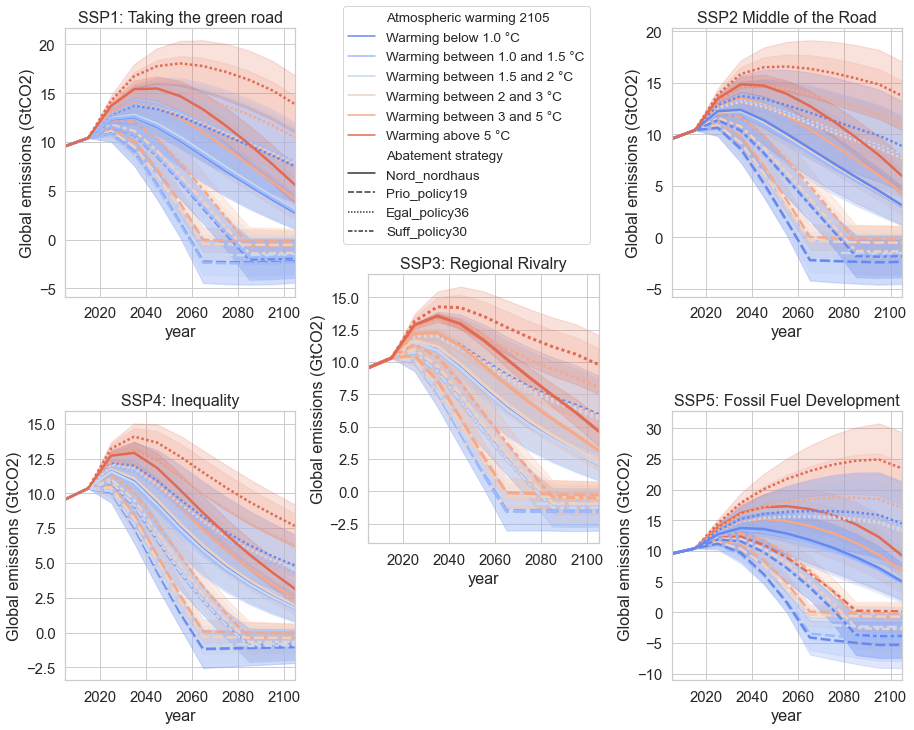

In [36]:
#build gridspec
sns.set(font_scale=1.35, style='whitegrid')

fig = plt.figure(constrained_layout=False,figsize=(15,12))
gs = fig.add_gridspec(24,25)
ax1 = fig.add_subplot(gs[0:10, 0:7])
ax3 = fig.add_subplot(gs[0:10, 18:25])
ax2 = fig.add_subplot(gs[9:19, 9:16])
ax4 = fig.add_subplot(gs[14:24, 0:7])
ax5 = fig.add_subplot(gs[14:24, 18:25])

axes = [ax1,ax3,ax2,ax4,ax5]

graph_titles = ["SSP1: Taking the green road","SSP2 Middle of the Road","SSP3: Regional Rivalry","SSP4: Inequality",
                "SSP5: Fossil Fuel Development"]

colors = {"Warming above 5 °C":sns.color_palette("coolwarm")[5],
          "Warming between 3 and 5 °C":sns.color_palette("coolwarm")[4],
          "Warming between 2 and 3 °C":sns.color_palette("coolwarm")[3],
          "Warming between 1.5 and 2 °C":sns.color_palette("coolwarm")[2],
          "Warming between 1.0 and 1.5 °C":sns.color_palette("coolwarm")[1], 
          "Warming below 1.0 °C":sns.color_palette("coolwarm")[0]}

#temperature_labels = list(df_pathway_graph['temperature_label'].unique())
#policy_list = list(df_pathway_graph['policy_recoded'].unique())
order_list = ["Warming below 1.0 °C","Warming between 1.0 and 1.5 °C","Warming between 1.5 and 2 °C",
              "Warming between 2 and 3 °C","Warming between 3 and 5 °C","Warming above 5 °C"]

df_pathway_graph_data = df_pathway_graph_data.rename({'emissions Gton': 'Global emissions (GtCO2)'},axis=1) 
df_pathway_graph_data = df_pathway_graph_data.rename({'policy_recoded': 'Abatement strategy'},axis=1) 
df_pathway_graph_data = df_pathway_graph_data.rename({'temperature_label': "Atmospheric warming 2105"},axis=1) 

policy_index = 0
axes_index  = 0

for ssp_scenario in range(1,6):  
    data = df_pathway_graph_data[(df_pathway_graph_data["scenario_pop_gdp"]==ssp_scenario)]            

    if axes_index == 2: 
        k = sns.lineplot(data=data,x="year", y="Global emissions (GtCO2)", style="Abatement strategy",hue="Atmospheric warming 2105",
                     palette=colors,linewidth=3,ci="sd",ax=axes[axes_index],legend = True,hue_order = order_list)
        ax2.legend(bbox_to_anchor=(0.85, 1.90),borderaxespad=-1.9,fontsize = 13.5)
        k.set(xlim=(2005,2105))

    else:
        k = sns.lineplot(data=data,x="year", y="Global emissions (GtCO2)", style="Abatement strategy",hue="Atmospheric warming 2105",
                     palette=colors,linewidth=2.5,ci="sd",ax=axes[axes_index],legend=False)
        k.set(xlim=(2005,2105))
    
    axes[axes_index].set_title(graph_titles[axes_index],fontdict={'fontsize' : 16}, loc='center')
    axes_index = axes_index + 1
    
plt.show()

fig.savefig("emission_pathways_overview.png",dpi=200,bbox_inches='tight')

In [37]:
k = df_pathway_graph_data.groupby(["Abatement strategy","Atmospheric warming 2105","scenario_pop_gdp"]).size().to_frame()/11
#k.to_excel("count_table.xlsx")
k.sort_values(['Abatement strategy','Atmospheric warming 2105'])
#k.to_excel("count_table.xlsx")
k.groupby(['Atmospheric warming 2105',"scenario_pop_gdp"]).sum()

0
Atmospheric warming 2105       scenario_pop_gdp        
Warming above 5 °C             0.0                158.0
                               1.0                213.0
                               2.0                170.0
                               3.0                 68.0
                               4.0                 39.0
                               5.0                577.0
Warming below 1.0 °C           0.0               2001.0
                               1.0               1694.0
                               2.0               1789.0
                               3.0               1766.0
                               4.0               1879.0
                               5.0               1914.0
Warming between 1.0 and 1.5 °C 0.0               3061.0
                               1.0               2543.0
                               2.0               2699.0
                               3.0               2831.0
                               4.0               2999.0
                               5.0               2459.0
Warming between 1.5 and 2 °C   0.0               4462.0
                               1.0               4178.0
                               2.0               4159.0
                               3.0               4783.0
                               4.0               4980.0
                               5.0               3496.0
Warming between 2 and 3 °C     0.0               8147.0
                               1.0               8462.0
                               2.0               8635.0
                               3.0               9448.0
                               4.0               9658.0
                               5.0               7319.0
Warming between 3 and 5 °C     0.0               5506.0
                               1.0               6243.0
                               2.0               5880.0
                               3.0               4437.0
                               4.0               3779.0
                               5.0               7568.0

# Temperature pathway graph

In [50]:
policy_list= ["Prio_policy19","Suff_policy30","Nord_nordhaus","Egal_policy36"]
objectives = ["Industrial Emission ","Atmospheric Temperature "]

outcomes =[]
for objective in objectives:
    for year in timepoints_to_save:

        name_year = objective + str(year)
        outcomes.append(name_year)

categories = ["scenario","scenario_pop_gdp","Economic scenario","scenario_limmiu","principle","policy_recoded", "temperature_label"]
columns = outcomes + categories

In [51]:
df_pathway_graph = results_total_short_term[results_total_short_term["policy_recoded"].isin(policy_list)].iloc[:,1:]

df_pathway_graph["temperature_label"] = ""

df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] > 5), "Warming above 5 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 5) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 3), "Warming between 3 and 5 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 3) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 2),  "Warming between 2 and 3 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 2) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 1.5),  "Warming between 1.5 and 2 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 1.5) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > 1), "Warming between 1.0 and 1.5 °C", inplace=True)
df_pathway_graph['temperature_label'].mask((df_pathway_graph['Atmospheric Temperature 2105'] < 1) &
                          (df_pathway_graph['Atmospheric Temperature 2105'] > -0.01), "Warming below 1.0 °C", inplace=True)

objectives = ["Atmospheric Temperature "]
outcomes =[]
for objective in objectives:
    for year in timepoints_to_save:

        name_year = objective + str(year)
        outcomes.append(name_year)

df_pathway_graph = df_pathway_graph[columns].reset_index(drop = True)
df_pathway_graph = df_pathway_graph.set_index(['scenario'])
df_pathway_graph_data = df_pathway_graph[outcomes].stack().to_frame().reset_index()
df_pathway_graph_data.columns = ["index","year","Atmospheric warming"]
df_pathway_graph_data["year"] = df_pathway_graph_data["year"].str[-4:].astype(int)
df_pathway_graph_data = df_pathway_graph_data.set_index(['index'])

In [52]:
categories = ["scenario_pop_gdp","Economic scenario","scenario_limmiu","principle","policy_recoded", "temperature_label"]

df_pathway_graph_cat= df_pathway_graph[categories][["scenario_pop_gdp"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","scenario_pop_gdp"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)

df_pathway_graph_cat= df_pathway_graph[categories][["policy_recoded"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","policy_recoded"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)

df_pathway_graph_cat= df_pathway_graph[categories][["scenario_limmiu"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","scenario_limmiu"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)

df_pathway_graph_cat= df_pathway_graph[categories][["temperature_label"]].stack().to_frame().reset_index()
df_pathway_graph_cat.columns = ["index","cat","temperature_label"]
df_pathway_graph_cat = df_pathway_graph_cat.drop(["cat"],axis=1)
df_pathway_graph_cat = df_pathway_graph_cat.set_index(["index"])

df_pathway_graph_data = df_pathway_graph_cat.join(df_pathway_graph_data) #, left_index=True, right_index=True)


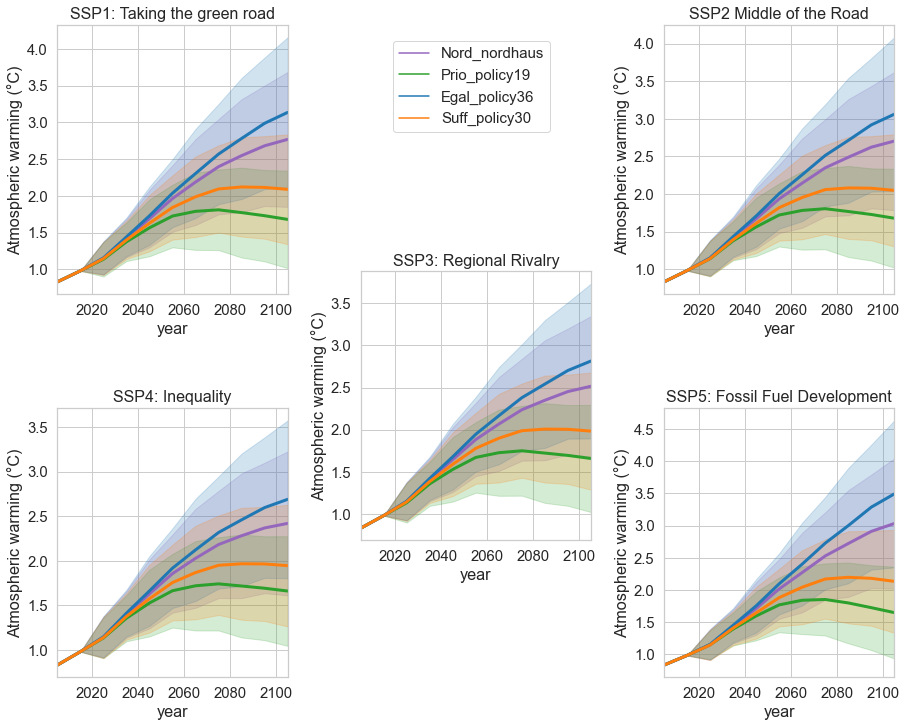

In [20]:
#build gridspec
sns.set(font_scale=1.35, style='whitegrid')

fig = plt.figure(constrained_layout=False,figsize=(15,12))
gs = fig.add_gridspec(24,25)
ax1 = fig.add_subplot(gs[0:10, 0:7])
ax3 = fig.add_subplot(gs[0:10, 18:25])
ax2 = fig.add_subplot(gs[9:19, 9:16])
ax4 = fig.add_subplot(gs[14:24, 0:7])
ax5 = fig.add_subplot(gs[14:24, 18:25])

axes = [ax1,ax3,ax2,ax4,ax5]

graph_titles = ["SSP1: Taking the green road","SSP2 Middle of the Road","SSP3: Regional Rivalry","SSP4: Inequality",
                "SSP5: Fossil Fuel Development"]

colors = {"Nord_nordhaus":sns.color_palette("tab10")[4],
          "Suff_policy30":sns.color_palette("tab10")[1],
          "Prio_policy19":sns.color_palette("tab10")[2],
          "Egal_policy36":sns.color_palette("tab10")[0]}

df_pathway_graph_data = df_pathway_graph_data.rename({'Atmospheric warming': 'Atmospheric warming (°C)'},axis=1) 
df_pathway_graph_data = df_pathway_graph_data.rename({'policy_recoded': 'Abatement strategy'},axis=1) 
df_pathway_graph_data = df_pathway_graph_data.rename({'temperature_label': "Atmospheric warming 2105"},axis=1) 

policy_index = 0
axes_index  = 0

for ssp_scenario in range(1,6):  
    data = df_pathway_graph_data[(df_pathway_graph_data["scenario_pop_gdp"]==ssp_scenario)]            

    if axes_index == 2: 
        k = sns.lineplot(data=data,x="year", y="Atmospheric warming (°C)",hue="Abatement strategy",
                         linewidth=3,ci="sd",ax=axes[axes_index],legend = True,palette=colors)
        ax2.legend(bbox_to_anchor=(0.7, 1.75),borderaxespad=-1.9,fontsize = 15)
        k.set(xlim=(2005,2105))

    else:
        k = sns.lineplot(data=data,x="year", y="Atmospheric warming (°C)",hue="Abatement strategy",
                         linewidth=3,ci="sd",ax=axes[axes_index],legend = False,palette=colors)
        k.set(xlim=(2005,2105))
    
    axes[axes_index].set_title(graph_titles[axes_index],fontdict={'fontsize' : 16}, loc='center')
    axes_index = axes_index + 1
    
plt.show()

fig.savefig("temperature_pathways_overview.png",dpi=200,bbox_inches='tight')

In [63]:
colors = {'Historical':"black", '2°C consistent':sns.color_palette("Set2")[1], 
          '1.5°C consistent':sns.color_palette("Set2")[4], 'Worst case RCP8.5': "grey",
           'Post-COVID-19':sns.color_palette("Paired")[0] , 'Pledges and Targets': sns.color_palette()[0],
           'Optimistic scenatio (net-zero targets)':sns.color_palette()[8],
           'Sufficitarian policy':sns.color_palette()[1],
           'Prioritarian policy':sns.color_palette()[2],
           'Nordhaus policy':sns.color_palette()[4],
           'Egalitarian policy':sns.color_palette()[6]}

In [106]:
#output_df = output_df[output_df['Pathway'] !=['Historical','2°C consistent','1.5°C consistent','Worst case RCP8.5',
#                                              'Post-COVID-19','Pledges and Targets','Optimistic scenatio (net-zero targets)']]

data = output_df[~output_df['Pathway'].isin(['Historical','2°C consistent','1.5°C consistent','Worst case RCP8.5',
                                              'Post-COVID-19','Pledges and Targets','Optimistic scenatio (net-zero targets)'])]

No handles with labels found to put in legend.


<Figure size 360x720 with 0 Axes>

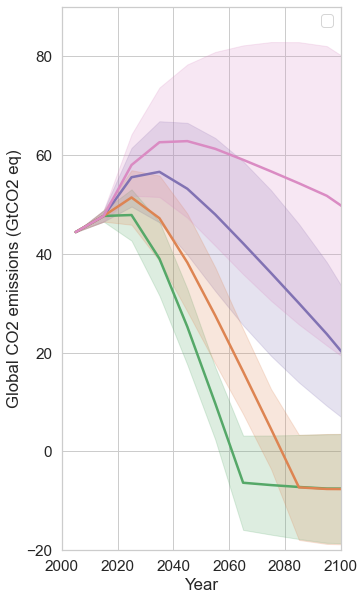

In [107]:
import seaborn as sns
from matplotlib import pyplot

sns.set(font_scale=1.4) #razy big
sns.set_style("whitegrid")
plt.figure(figsize=(5,10))


output_df.loc[output_df["Pathway"] == 'AR5 BAU','Pathway'] = "Worst case RCP8.5"

colors = {'Historical':"black", '2°C consistent':sns.color_palette("Set2")[1], 
          '1.5°C consistent':sns.color_palette("Set2")[4], 'Worst case RCP8.5': "grey",
           'Post-COVID-19':sns.color_palette("Paired")[0] , 'Pledges and Targets': sns.color_palette()[0],
           'Optimistic scenatio (net-zero targets)':sns.color_palette()[8],
           'Sufficitarian policy':sns.color_palette()[1],
           'Prioritarian policy':sns.color_palette()[2],
           'Nordhaus policy':sns.color_palette()[4],
           'Egalitarian policy':sns.color_palette()[6]}

a4_dims = (5, 10)
#df = mylib.load_data()
fig, ax = pyplot.subplots(figsize=a4_dims)

k= sns.lineplot(data=data,x = "Year" , y = "GtCO2 equivalent", hue= "Pathway",palette = colors,lw=2.5,ci="sd",ax=ax,legend=False)
k.set(ylabel='Global CO2 emissions (GtCO2 eq)')

#plt.title("2100 Warming projections compared with principles", fontsize=22)
k.set(xlim=(2000,2100),ylim=(-20,90))

plt.legend()
plt.show()

k.figure.savefig("2100_co2_comparision_final.png",dpi = 200,bbox_inches ="tight")

<Figure size 360x720 with 0 Axes>

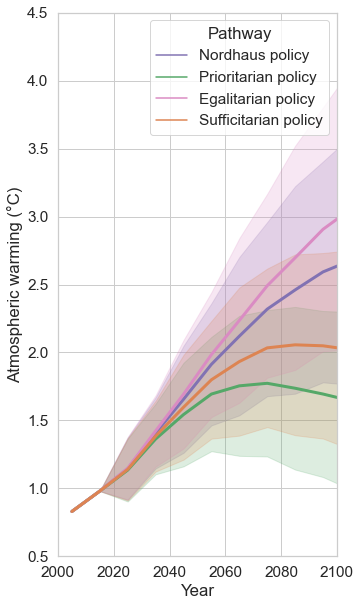

In [116]:
sns.set(font_scale=1.4) #razy big
sns.set_style("whitegrid")
plt.figure(figsize=(5,10))
data = df_pathway_graph_data
data.columns = ['temperature_label','scenario_limmiu','Pathway',"scenario_pop_gdp",'Year',"Atmospheric warming (°C)"]

mapping = {"Nord_nordhaus":"Nordhaus policy","Suff_policy30": "Sufficitarian policy",
           "Prio_policy19":"Prioritarian policy","Egal_policy36":"Egalitarian policy"}
data = data.replace({"Pathway": mapping})
a4_dims = (5, 10)
#df = mylib.load_data()
fig, ax = pyplot.subplots(figsize=a4_dims)

k = sns.lineplot(data=data,x="Year", y="Atmospheric warming (°C)",hue="Pathway",linewidth=3,ci="sd",legend = True,palette=colors,ax=ax)

#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


#handles = k._legend_data.values()
#labels = k._legend_data.keys()
#k.fig.legend(title='Principle', handles=handles, labels=labels, loc='upper center', ncol=3)
#k.fig.subplots_adjust(top=0.90, bottom=0.08)
k.set(xlim=(2000,2100),ylim=(0.5,4.5))

k.figure.savefig("2100_temp_comparision_final.png",dpi = 200,bbox_inches ="tight")


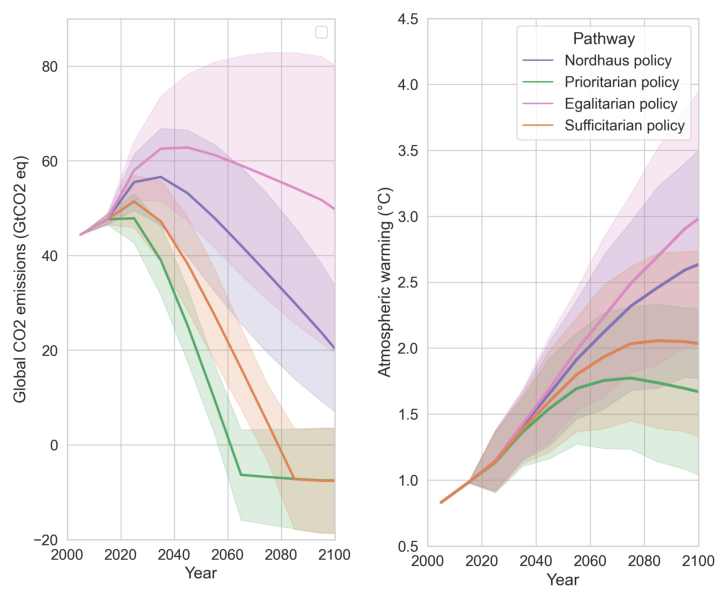

In [117]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

fig2 = plt.figure(constrained_layout=True,figsize=(10,20))
spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig2)

#f2_ax1 = fig.add_subplot(gs[0:10, 0:7])
#f2_ax2 = fig.add_subplot(gs[0:10, 18:25])

f2_ax1 = fig2.add_subplot(spec2[0],frameon=False)
f2_ax2 = fig2.add_subplot(spec2[1],frameon=False)

f2_ax1.axes.get_yaxis().set_visible(False)
f2_ax2.axes.get_yaxis().set_visible(False)
f2_ax1.axes.get_xaxis().set_visible(False)
f2_ax2.axes.get_xaxis().set_visible(False)

f2_ax1.imshow(mpimg.imread('2100_co2_comparision_final.png'))
f2_ax2.imshow(mpimg.imread('2100_temp_comparision_final.png'))
#f2_ax3.imshow(mpimg.imread('worst_case_climate_objectives_3.png'))
#f2_ax4.imshow(mpimg.imread('worst_case_climate_objectives_4.png'))

fig2.savefig("Comparision_emission_temperature.png", dpi=200,bbox_inches='tight')